<a href="https://colab.research.google.com/github/mana9512/bank-term-deposit-prediction/blob/main/Model_Interpretability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Model Interpretability
  by Manashree Patel

NUID: 002770365

# **Dataset Used :** *Bank Term Deposit Predictions*

***link :*** [https://www.kaggle.com/datasets/thedevastator/bank-term-deposit-predictions?rvi=1](https://www.kaggle.com/datasets/thedevastator/bank-term-deposit-predictions?rvi=1)

---

# **About Dataset :**

This dataset, titled Direct Marketing Campaigns for Bank Term Deposits, is a collection of data related to the direct marketing campaigns conducted by a Portuguese banking institution. These campaigns primarily involved phone calls with customers, and the objective was to determine whether or not a customer would subscribe to a term deposit offered by the bank.


---

# **Features :**

The dataset contains various features that provide insights into customer attributes and campaign outcomes. These features include:

**Age**: The age of the customer.

**Job**: The occupation of the customer.

**Marital Status**: The marital status of the customer.

**Education**: The education level of the customer.

**Default**: Whether or not the customer has credit in default.

**Balance**: The balance of the customer's account.

**Housing Loan**: Whether or not the customer has a housing loan.

**Contact Communication Type**: The method used to contact the customer (e.g., telephone, cellular).

**Day**: The day of the month when the last contact with the customers was made.

**Duration**: The duration (in seconds) of the last contact with customers during a campaign.

**Campaign Contacts Count**: Number of contacts performed during this campaign for each customer.

**pdays** : number days passed since previously contacted form previous camapign

**poutcome** : outcome from previous marketing campaign

The purpose behind this dataset is to train a predictive model that can determine if a given customer will subscribe to a term deposit based on these various features.

# ***Data Preprocessing***


---
Data preprocessing is a process that takes raw data and transforms it into a format that can be understood and analyzed by computers and machine learning.


> STEPS IN DATA PREPROCESSING

1. **Data collection**
Initially, data collection is performed by gathering raw data from diverse sources, ensuring its accuracy and relevance
2. **Data cleaning and missing value imputation**
 Subsequently, data cleaning takes place, addressing tasks like removing duplicates, correcting errors, and handling missing values through techniques such as mean imputation or linear interpolation.
3. **Data transformation and normalization**
Following this, data transformation and normalization occur, where the data is converted into a more suitable form for analysis, including tasks like scaling and encoding categorical variables.
4. **Data reduction and feature selection**
Lastly, the process involves data reduction and feature selection, identifying and selecting the most relevant features while eliminating redundant or irrelevant ones using techniques like dimensionality reduction or feature selection algorithms.



# **Step 1: Importing the required Libraries**

In [70]:
#installing dependencies

!pip install scikit-learn==1.4.0
!pip install eli5
!pip install shap
!pip install lime
!pip install time_tabular


ERROR: Could not find a version that satisfies the requirement time_tabular (from versions: none)
ERROR: No matching distribution found for time_tabular


In [71]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
from lime.lime_tabular import LimeTabularExplainer
import shap
import sklearn
import warnings
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
warnings.filterwarnings('ignore')
seed = 0


# **Step 2: Importing the Dataset**

In [72]:
#read the csv
df_train_original = pd.read_csv('https://raw.githubusercontent.com/mana9512/bank-term-deposit-prediction/main/train.csv')
df_test_original = pd.read_csv('https://raw.githubusercontent.com/mana9512/bank-term-deposit-prediction/main/test.csv')

In [73]:
df_train_original.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [74]:
print("Number of rows in training dataset: ", df_train_original.shape[0])
print("Number of columns in training dataset: ", df_train_original.shape[1])


Number of rows in training dataset:  45211
Number of columns in training dataset:  17


In [75]:
df_test_original.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no


In [76]:
print("Number of rows in test dataset: ", df_test_original.shape[0])
print("Number of columns in test dataset: ", df_test_original.shape[1])

Number of rows in test dataset:  4521
Number of columns in test dataset:  17


In [77]:
df_train_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


There are **7 Numeric** and **9 Categorical** features.




In [78]:
df_train_original.dtypes


age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

In [79]:
numerical_columns = df_train_original.select_dtypes("int64").columns
categorical_columns = df_train_original.select_dtypes("object").columns
numerical_columns = list(numerical_columns)
categorical_columns= list(categorical_columns)

print("Numerical Columns", numerical_columns)
print("Categorical Columns", categorical_columns)

Numerical Columns ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']
Categorical Columns ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'y']


In [80]:
unique = set(list(df_train_original.dtypes))
unique

{dtype('int64'), dtype('O')}

There are **no missing values** found




In [81]:
df_train_original.isnull().sum()


age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [82]:
df_test_original.isnull().sum()


age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

# ***Step 3: Data Preprocessing***


# ***Encoding***


In [83]:
#Encoded categorial using label encoder technique
label_encoder = LabelEncoder()
df_train = df_train_original.copy()
df_test = df_test_original.copy()

categorical_features = df_train.select_dtypes('object').columns
for feature in categorical_features:
  df_train[feature] = label_encoder.fit_transform(df_train[feature])


categorical_features = df_test.select_dtypes('object').columns
for feature in categorical_features:
  df_test[feature] = label_encoder.fit_transform(df_test[feature])

In [84]:
df_train

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,9,977,3,-1,0,3,1
45207,71,5,0,0,0,1729,0,0,0,17,9,456,2,-1,0,3,1
45208,72,5,1,1,0,5715,0,0,0,17,9,1127,5,184,3,2,1
45209,57,1,1,1,0,668,0,0,1,17,9,508,4,-1,0,3,0


In [85]:
df_test

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,10,1,0,0,1787,0,0,0,19,10,79,1,-1,0,3,0
1,33,7,1,1,0,4789,1,1,0,11,8,220,1,339,4,0,0
2,35,4,2,2,0,1350,1,0,0,16,0,185,1,330,1,0,0
3,30,4,1,2,0,1476,1,1,2,3,6,199,4,-1,0,3,0
4,59,1,1,1,0,0,1,0,2,5,8,226,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,33,7,1,1,0,-333,1,0,0,30,5,329,5,-1,0,3,0
4517,57,6,1,2,1,-3313,1,1,2,9,8,153,1,-1,0,3,0
4518,57,9,1,1,0,295,0,0,0,19,1,151,11,-1,0,3,0
4519,28,1,1,1,0,1137,0,0,0,6,3,129,4,211,3,1,0


In [86]:
#extract independent variables
X_train =  df_train.drop('y', axis=1)
#extract target variable
y_train = df_train['y']


X_test =  df_test.drop('y', axis=1)
#extract target variable
y_test = df_test['y']

In [87]:
X_train.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

In [88]:
#check categorical values after label encoding
X_train.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3


In [89]:
# check for null values after label encoding
X_test.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

In [90]:
X_test.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,30,10,1,0,0,1787,0,0,0,19,10,79,1,-1,0,3
1,33,7,1,1,0,4789,1,1,0,11,8,220,1,339,4,0
2,35,4,2,2,0,1350,1,0,0,16,0,185,1,330,1,0
3,30,4,1,2,0,1476,1,1,2,3,6,199,4,-1,0,3
4,59,1,1,1,0,0,1,0,2,5,8,226,1,-1,0,3


In [91]:
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: y, dtype: int64

# **Feature Scaling**

> MinMaxScaler is a machine learning preprocessing technique that adjusts a feature set to a specified range, commonly between 0 and 1. The process involves subtracting the minimum value of each feature from its data points and dividing the outcome by the range (the difference between the maximum and minimum values). The primary objective of this normalization is to standardize all features to a uniform scale, particularly advantageous for algorithms that assign weights to inputs, such as neural networks. This normalization ensures that no single feature dominates others in magnitude, contributing to enhanced model performance.




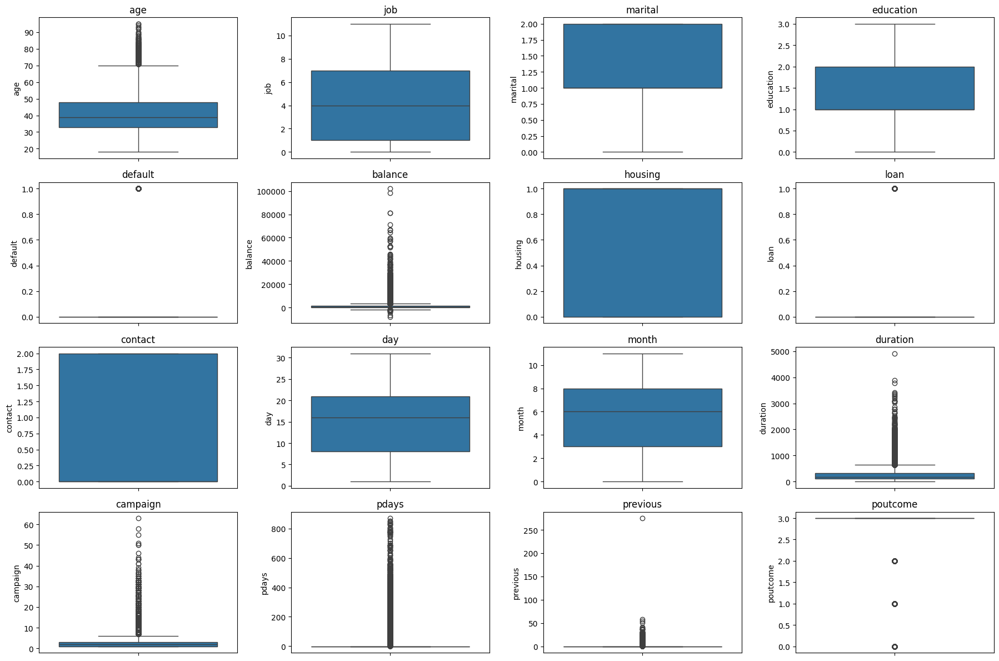

In [92]:
#extract columns from dataset
features = X_train.columns

fig, axes = plt.subplots(4, 4, figsize=(18, 12))
axes = axes.flatten()

# Plot box plot for each feature in the grid
for i, feature in enumerate(features):
    sns.boxplot(data=X_train[feature], ax=axes[i])
    axes[i].set_title(feature)

for j in range(i+1, len(axes)):
  axes[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

***From above box-plots for every feature, we can see that every feature has different scale.***

In [93]:
from sklearn import preprocessing

# Preparing for normalizing
X_train_scaled = X_train
X_test_scaled = X_test
min_max_scaler = preprocessing.MinMaxScaler()
X_train_columns = list(X_train.columns)
X_test_columns = list(X_test.columns)
# # Run the normalizer on the dataframe
X_train_scaled[X_train_columns] = min_max_scaler.fit_transform(X_train[X_train_columns])
X_test_scaled[X_test_columns]= pd.DataFrame(min_max_scaler.fit_transform(X_test[X_test_columns]))

In [94]:
X_train_scaled.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,0.519481,0.363636,0.5,0.666667,0.0,0.092259,1.0,0.0,1.0,0.133333,0.727273,0.053070,0.0,0.0,0.0,1.0
1,0.337662,0.818182,1.0,0.333333,0.0,0.073067,1.0,0.0,1.0,0.133333,0.727273,0.030704,0.0,0.0,0.0,1.0
2,0.194805,0.181818,0.5,0.333333,0.0,0.072822,1.0,1.0,1.0,0.133333,0.727273,0.015453,0.0,0.0,0.0,1.0
3,0.376623,0.090909,0.5,1.000000,0.0,0.086476,1.0,0.0,1.0,0.133333,0.727273,0.018707,0.0,0.0,0.0,1.0
4,0.194805,1.000000,1.0,1.000000,0.0,0.072812,0.0,0.0,1.0,0.133333,0.727273,0.040260,0.0,0.0,0.0,1.0


In [95]:
X_test_scaled.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,0.161765,0.909091,0.5,0.000000,0.0,0.068455,0.0,0.0,0.0,0.600000,0.909091,0.024826,0.000000,0.000000,0.00,1.0
1,0.205882,0.636364,0.5,0.333333,0.0,0.108750,1.0,1.0,0.0,0.333333,0.727273,0.071500,0.000000,0.389908,0.16,0.0
2,0.235294,0.363636,1.0,0.666667,0.0,0.062590,1.0,0.0,0.0,0.500000,0.000000,0.059914,0.000000,0.379587,0.04,0.0
3,0.161765,0.363636,0.5,0.666667,0.0,0.064281,1.0,1.0,1.0,0.066667,0.545455,0.064548,0.061224,0.000000,0.00,1.0
4,0.588235,0.090909,0.5,0.333333,0.0,0.044469,1.0,0.0,1.0,0.133333,0.727273,0.073486,0.000000,0.000000,0.00,1.0


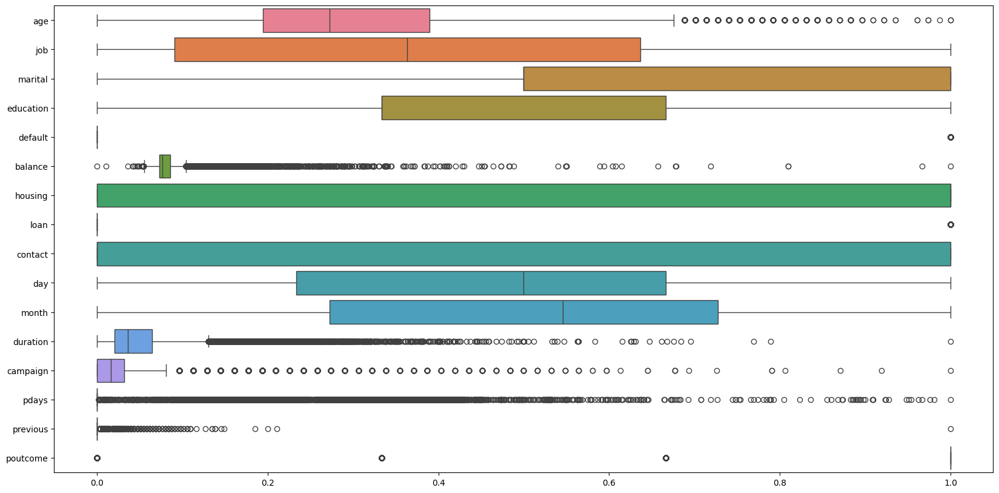

In [96]:
plt.figure(figsize=(20, 10))  # Adjust the height as needed
sns.boxplot(data=X_train_scaled, orient="h")
plt.show()

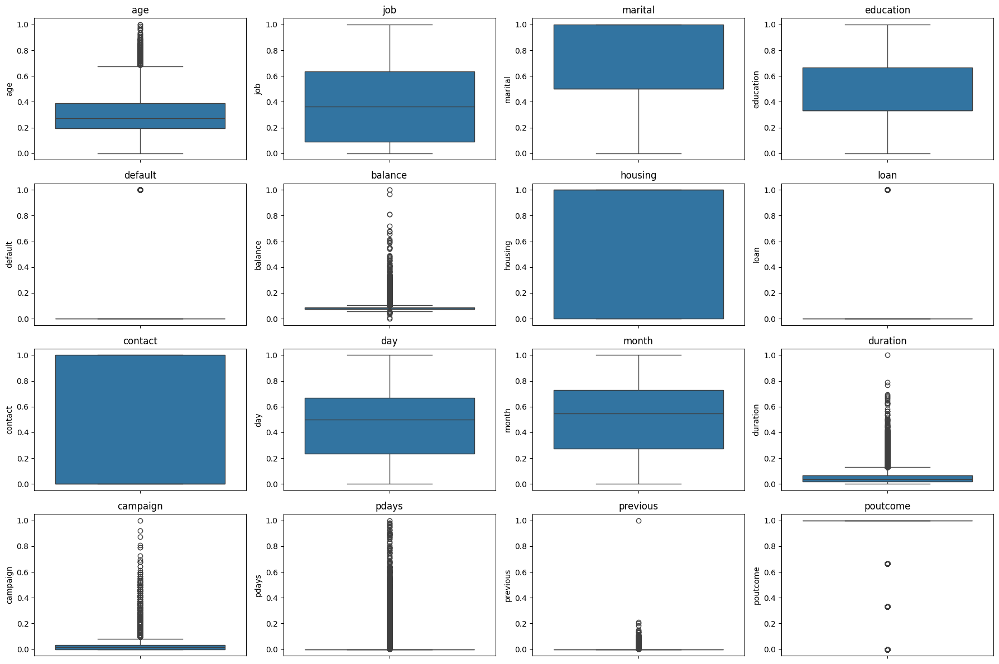

In [97]:
#extract columns from dataset
features = X_train_scaled.columns

fig, axes = plt.subplots(4, 4, figsize=(18, 12))
axes = axes.flatten()

#Plot box plot for each feature in the grid
for i, feature in enumerate(features):
    sns.boxplot(data=X_train_scaled[feature], ax=axes[i])
    axes[i].set_title(feature)

for j in range(i+1, len(axes)):
  axes[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

***After performing feature scaling, every feature is scaled between 0 to 1.***

# ***Step 4: Training models***

# **1. Fit a linear model and interpret the regression coefficients**




> # **Model 1: Logistic Regression**







In [98]:
from sklearn.linear_model import LogisticRegression
classifier1= LogisticRegression(random_state=0)
classifier1.fit(X_train_scaled,y_train)



dependent_vars_train =y_train

independent_vars_train = X_train_scaled[X_train_scaled.columns]

independent_vars_test = X_test_scaled[X_test_scaled.columns]

dependent_vars_test = y_test

# Fitting the OLS model
results = sm.OLS(y_train,  X_train_scaled[X_train_scaled.columns]).fit()
p_values = results.summary2().tables[1]['P>|t|']
print(p_values.round(4))
print(results.summary())

age          0.2922
job          0.4323
marital      0.0000
education    0.0000
default      0.0136
balance      0.1048
housing      0.0000
loan         0.0000
contact      0.0000
day          0.0000
month        0.0000
duration     0.0000
campaign     0.0000
pdays        0.0000
previous     0.0000
poutcome     0.0001
Name: P>|t|, dtype: float64
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.302
Model:                            OLS   Adj. R-squared (uncentered):              0.301
Method:                 Least Squares   F-statistic:                              1220.
Date:                Mon, 18 Mar 2024   Prob (F-statistic):                        0.00
Time:                        02:41:29   Log-Likelihood:                         -7530.9
No. Observations:               45211   AIC:                                  1.509e+04
Df Residuals:                   4519

# **2. Fit a Tree-Based Model and Interpret the Nodes**

# **Model 2: Tree Classifier**

In [99]:
from sklearn.tree import DecisionTreeClassifier, export_text

decision_tree_classifier = DecisionTreeClassifier()
decision_tree_classifier.fit(X_train_scaled, y_train)
r = export_text(decision_tree_classifier, feature_names=X_train_scaled.columns.tolist())
print(r)

|--- duration <= 0.11
|   |--- month <= 0.86
|   |   |--- pdays <= 0.01
|   |   |   |--- age <= 0.55
|   |   |   |   |--- duration <= 0.06
|   |   |   |   |   |--- month <= 0.05
|   |   |   |   |   |   |--- housing <= 0.50
|   |   |   |   |   |   |   |--- duration <= 0.02
|   |   |   |   |   |   |   |   |--- balance <= 0.07
|   |   |   |   |   |   |   |   |   |--- age <= 0.24
|   |   |   |   |   |   |   |   |   |   |--- duration <= 0.01
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |   |--- duration >  0.01
|   |   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- age >  0.24
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- balance >  0.07
|   |   |   |   |   |   |   |   |   |--- duration <= 0.02
|   |   |   |   |   |   |   |   |   |   |--- balance <= 0.07
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |

# **3. Use AutoML to Find the Best Model**

In [100]:
!pip install h2o
import h2o
from h2o.automl import H2OAutoML
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 43 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_unknownUser_wtpcq3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.038 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [101]:

df_train_combined=pd.concat([independent_vars_train,dependent_vars_train],axis=1)
print(df_train_combined.head().to_markdown())
print("\n")
df_test_combined=pd.concat([independent_vars_test,dependent_vars_test],axis=1)
print(df_test_combined.head().to_markdown())

|    |      age |       job |   marital |   education |   default |   balance |   housing |   loan |   contact |      day |    month |   duration |   campaign |   pdays |   previous |   poutcome |   y |
|---:|---------:|----------:|----------:|------------:|----------:|----------:|----------:|-------:|----------:|---------:|---------:|-----------:|-----------:|--------:|-----------:|-----------:|----:|
|  0 | 0.519481 | 0.363636  |       0.5 |    0.666667 |         0 | 0.0922594 |         1 |      0 |         1 | 0.133333 | 0.727273 |  0.0530704 |          0 |       0 |          0 |          1 |   0 |
|  1 | 0.337662 | 0.818182  |       1   |    0.333333 |         0 | 0.0730667 |         1 |      0 |         1 | 0.133333 | 0.727273 |  0.0307035 |          0 |       0 |          0 |          1 |   0 |
|  2 | 0.194805 | 0.181818  |       0.5 |    0.333333 |         0 | 0.0728215 |         1 |      1 |         1 | 0.133333 | 0.727273 |  0.0154534 |          0 |       0 |          0 |     

In [102]:
df_train_h2o = h2o.H2OFrame(df_train_combined)
df_test_h2o = h2o.H2OFrame(df_test_combined)
print(df_train_h2o.describe)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
<bound method H2OFrame.describe of H2OFrame({'_ex': <Expr()#Key_Frame__upload_b4e6c6eaaac6b589c1cf9f4b1dbc4633.hex>})>


In [103]:
y = 'y'
#dropping the target column
X_train_h2o = df_train_h2o.drop(y)
X_train_columns=X_train_h2o.col_names

In [104]:
X_test_h2o = df_test_h2o.drop(y)

In [105]:
aml = H2OAutoML(max_models=20,seed=0,verbosity="debug",nfolds=0)
aml.train(x=X_train_columns, y=y, training_frame=df_train_h2o)

AutoML progress: |
02:41:50.432: Project: AutoML_2_20240318_24150
02:41:50.432: Cross-validation disabled by user: no fold column nor nfolds > 1.
02:41:50.433: Setting stopping tolerance adaptively based on the training frame: 0.004703032105125448
02:41:50.433: Build control seed: 0
02:41:50.435: Since cross-validation is disabled, and validation frame(s) were not provided, automatically split the training data into training, validation frame(s) in the ratio 90/10/0.
02:41:50.745: training frame: Frame key: AutoML_2_20240318_24150_training_Key_Frame__upload_b4e6c6eaaac6b589c1cf9f4b1dbc4633.hex    cols: 17    rows: 40634  chunks: 2    size: 1535583  checksum: -1446409613290894360
02:41:50.757: validation frame: Frame key: AutoML_2_20240318_24150_validation_Key_Frame__upload_b4e6c6eaaac6b589c1cf9f4b1dbc4633.hex    cols: 17    rows: 4577  chunks: 2    size: 177261  checksum: -8582566108899815336
02:41:50.757: leaderboard frame: Frame key: AutoML_2_20240318_24150_validation_Key_Frame__uplo

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,80.0,80.0,151415.0,15.0,15.0,15.0,52.0,238.0,145.3125
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2024-03-18 02:42:22,0.004 sec,0.0,0.3214151,0.2066153,0.1033076,0.3212877,0.2065335,0.1032258
,2024-03-18 02:42:23,1.507 sec,5.0,0.2830013,0.1785568,0.0800898,0.2861020,0.1797398,0.0818544
,2024-03-18 02:42:25,3.081 sec,10.0,0.2659361,0.1624373,0.0707220,0.2713628,0.1647564,0.0736377
,2024-03-18 02:42:26,4.620 sec,15.0,0.2538650,0.1482264,0.0644474,0.2616663,0.1517056,0.0684692
,2024-03-18 02:42:28,6.017 sec,20.0,0.2482780,0.1407316,0.0616420,0.2577578,0.1449357,0.0664391
,2024-03-18 02:42:29,7.505 sec,25.0,0.2436861,0.1339225,0.0593829,0.2549251,0.1389607,0.0649868
,2024-03-18 02:42:31,9.315 sec,30.0,0.2404229,0.1299687,0.0578032,0.2531552,0.1357550,0.0640876
,2024-03-18 02:42:32,10.806 sec,35.0,0.2377110,0.1273188,0.0565065,0.2519288,0.1338087,0.0634681


In [106]:
types = df_train_h2o.types

# Print data types
print(types)

{'age': 'real', 'job': 'real', 'marital': 'real', 'education': 'real', 'default': 'int', 'balance': 'real', 'housing': 'int', 'loan': 'int', 'contact': 'real', 'day': 'real', 'month': 'real', 'duration': 'real', 'campaign': 'real', 'pdays': 'real', 'previous': 'real', 'poutcome': 'real', 'y': 'int'}


In [107]:
# Get the best model
best_model = aml.leader
prediction = aml.leader.predict(X_test_h2o)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [108]:
print(prediction)
print(type(prediction))


     predict
 0.210581
 0.0473674
 0.079463
 0.00946769
 0.328618
 0.420435
 0.362556
-0.00163383
 0.000293454
 0.115244
[4521 rows x 1 column]

<class 'h2o.frame.H2OFrame'>


In [109]:
prediction=prediction.as_data_frame()
prediction=prediction['predict'].tolist()
print(prediction)

[0.210580753504785, 0.0473673864947548, 0.0794630174389956, 0.0094676878519228, 0.3286183267149161, 0.4204351602932936, 0.3625555445836133, -0.0016338337369754, 0.0002934541092534104, 0.1152440316548952, -0.0388945378087166, -0.0057817072189729, 0.4098992502007084, 0.8718576726281233, 0.0225134504765653, 0.0326762087100567, 0.2400646918434565, 0.1074950923615167, 0.0426857162868534, 0.3927774509541839, -0.0105614026760187, 0.023762010954754, 0.0064042961651855, 0.0013241190520991, 0.0122489518938371, 0.0914315666308018, 0.0031410185159463, 0.1459816741702004, 0.0199881453303012, 0.0197417853267714, 0.7877048641351783, -0.0069481350562066, 0.0676633696924389, 0.7590863104163352, 0.3750192242772234, 0.0231132231777726, 0.4313253595249469, 0.1501425732115811, 0.5375963698428157, -0.0043163022343444, 0.3200138772575362, 0.0053820464130174, 0.4295533226571413, 0.1067106277481277, 0.0049106914533174, -0.0126773274156741, -0.1209174238935313, 0.2464840377791395, 0.0145152714788698, 0.76868336

In [110]:
prediction = [1 if value > 0.5 else 0 for value in prediction]

In [111]:
y_t=df_test_h2o.as_data_frame()
y_t=y_t['y'].tolist()

In [112]:
print(prediction)
print(len(prediction))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 

In [113]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_t,prediction)
print(cm)
from sklearn.metrics import accuracy_score, classification_report
report = classification_report(y_t,prediction)
print(report)
acc= accuracy_score(y_t,prediction)
print("Accuracy is: ",acc)

[[3652  348]
 [ 162  359]]
              precision    recall  f1-score   support

           0       0.96      0.91      0.93      4000
           1       0.51      0.69      0.58       521

    accuracy                           0.89      4521
   macro avg       0.73      0.80      0.76      4521
weighted avg       0.91      0.89      0.89      4521

Accuracy is:  0.887193098871931


# **4. Run SHAP Analysis on the Models from steps 1, 2, and 3**
> SHAP (SHapley Additive exPlanations) values are a way to explain the output of any machine learning model. It uses a game theoretic approach that measures each player's contribution to the final outcome.

> Analyzing SHAP values is an effective way to understand how machine learning models make predictions. These values assign importance to each input feature, showing how much it contributes to the final prediction. By dissecting each feature's impact, SHAP values offer insights into the model's decision-making process.

> This breakdown helps in pinpointing key features that heavily influence specific predictions and understanding their role in shaping the model's outcomes. Moreover, it aids in refining the model's accuracy, detecting biases or errors, and enhancing the trustworthiness of its predictions.

# **Method 1. Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

### **a. SHAP Explainer**

>  Features with higher absolute SHAP values hold more significance. To gauge the overall importance of each feature, we calculate the average absolute SHAP values across the dataset. Next, we arrange and visualize the features in descending order based on their relevance.

> Two plots are presented below:
 1. SHAP feature importance for a linear model
 2. SHAP feature importance for a tree-based model
The plots show a difference in feature importance for both models.

In [114]:
# Taking 4000 samples out for SHAP analysis as it is a computationally expensive process
X_train_4000 = shap.utils.sample(
    X_train_scaled, 4000
)
X_test_100 = shap.utils.sample(
    X_test_scaled, 4000
)

In [115]:
explainer = shap.Explainer(classifier1.predict, X_train_4000, seed=seed)
linear_shap_values = explainer(X_train_4000)

PermutationExplainer explainer: 4001it [03:49, 16.68it/s]                          


In [116]:
explainer1 = shap.Explainer(decision_tree_classifier.predict, X_train_4000, seed=seed)
tree_shap_values = explainer1(X_train_4000)


PermutationExplainer explainer: 4001it [03:01, 20.62it/s]                          


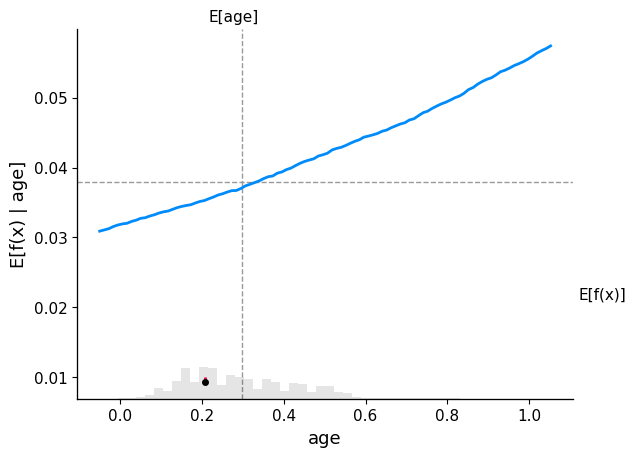

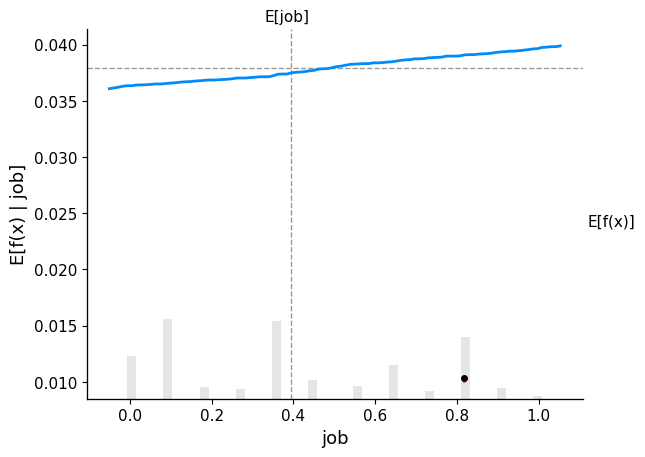

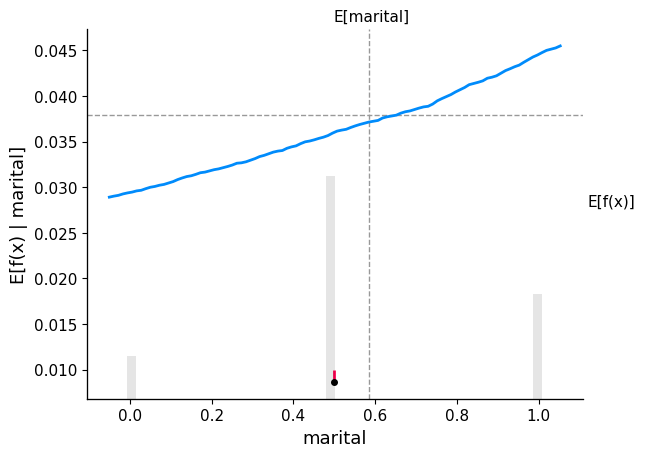

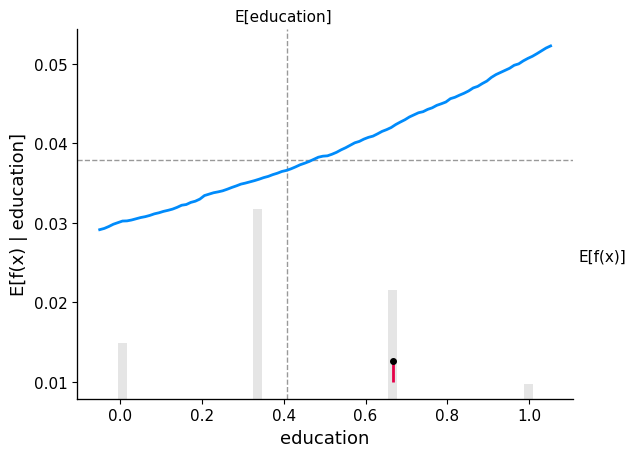

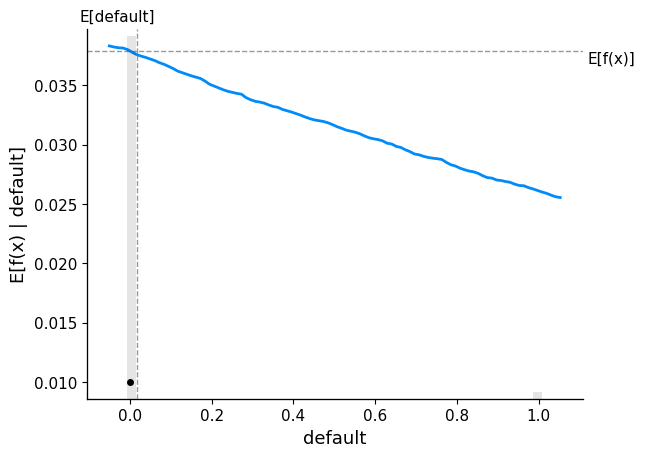

...

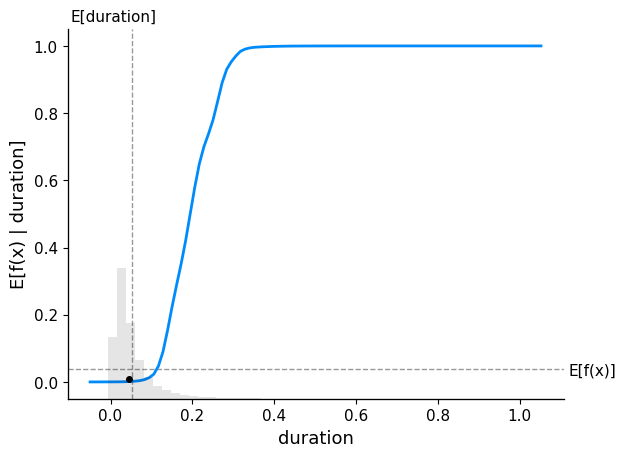

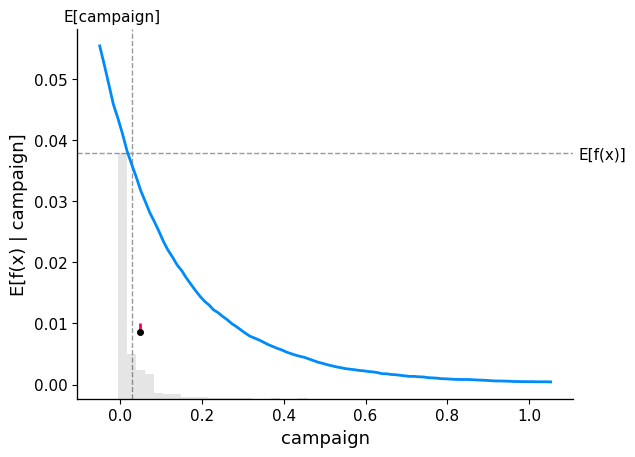

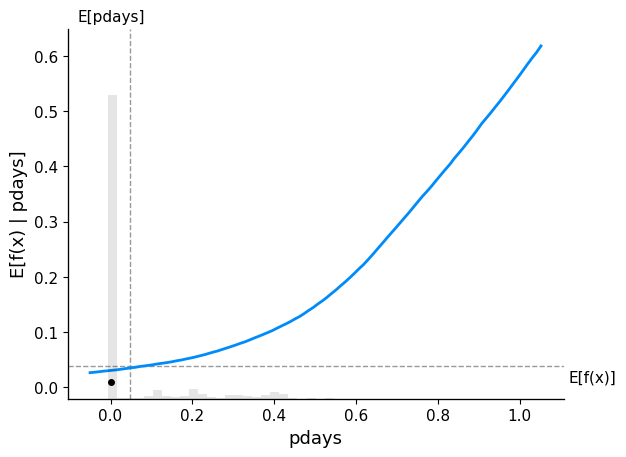

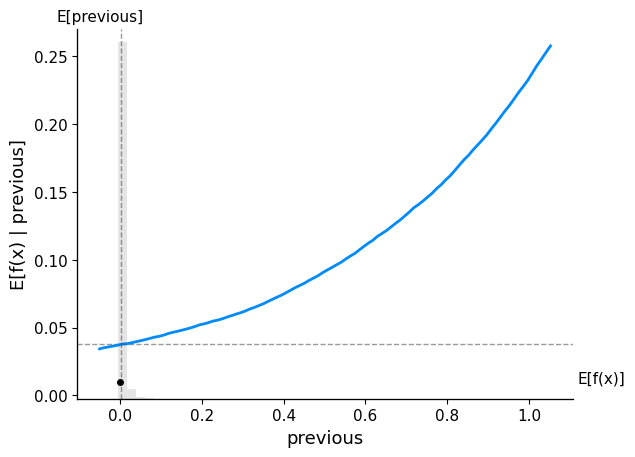

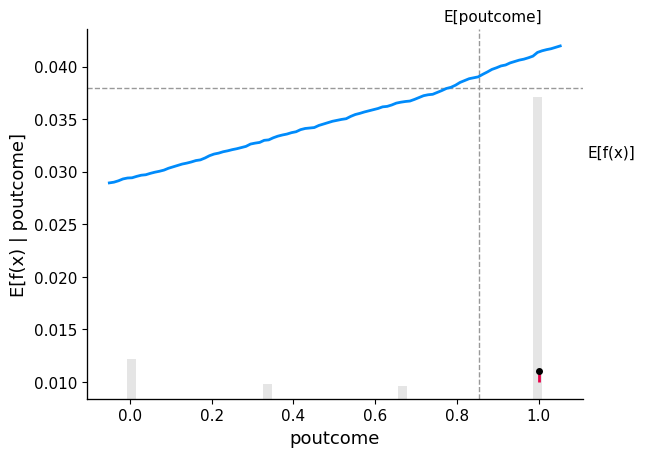

In [117]:
for i in X_train_scaled.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        classifier1.predict,
        X_train_scaled,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Direction of the Line: The direction of the line indicates the direction of the relationship between the feature and the predicted outcome.

Positive Slope: A line sloping upwards suggests a positive relationship, meaning that higher values of the feature are associated with higher predicted outcomes.

Negative Slope: Conversely, a line sloping downwards indicates a negative relationship, where higher values of the feature correspond to lower predicted outcomes.

Horizontal Line: A horizontal line suggests that the feature has little to no effect on the predicted outcome across its range of values.

> Steeper Slope: A steeper slope suggests a stronger influence of the feature on the predicted outcome. Small changes in the feature value lead to more significant changes in the predicted outcome.

> Gentle Slope: A gentler slope indicates a weaker influence of the feature on the predicted outcome. Small changes in the feature value result in smaller changes in the predicted outcome.

### **b. Bar Plots**
The SHAP feature importance concept is easy to comprehend: Features with high absolute Shapley values are significant. To determine the global relevance of each feature, we average the absolute Shapley values throughout the data. We then sort and plot the features in decreasing order of relevance.

Two plots are presented below:

SHAP feature importance for a linear model
SHAP feature importance for a tree-based model
The plots show a difference in feature importance for both models. In the linear model, the Credit_History feature is of greater importance.

On the other hand, in the tree-based model, Credit_History is the most crucial feature, followed by the Loan_Amount feature.

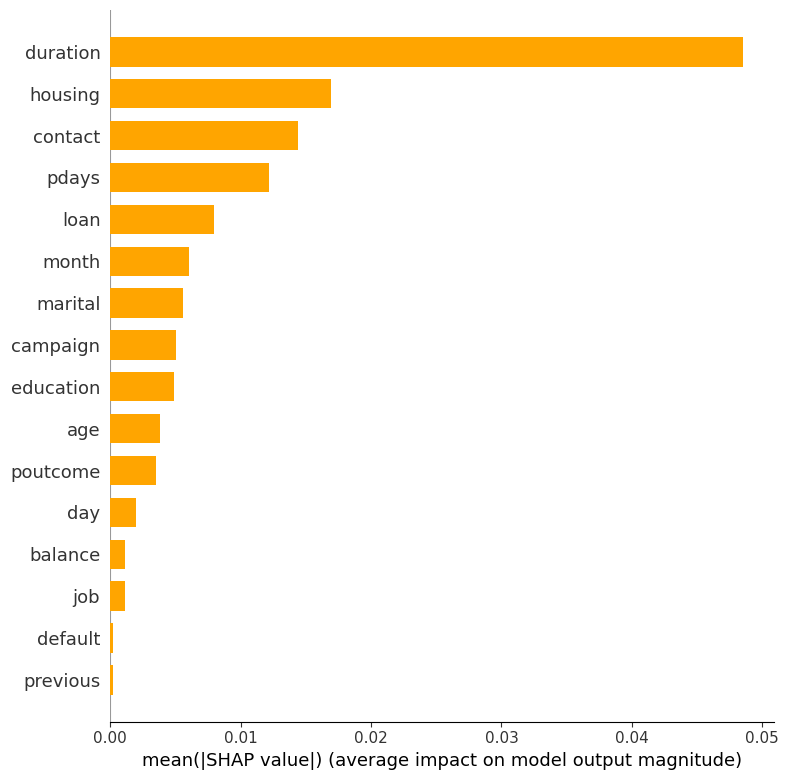

In [118]:
shap.summary_plot(linear_shap_values, X_train_scaled, plot_type="bar", color="orange")

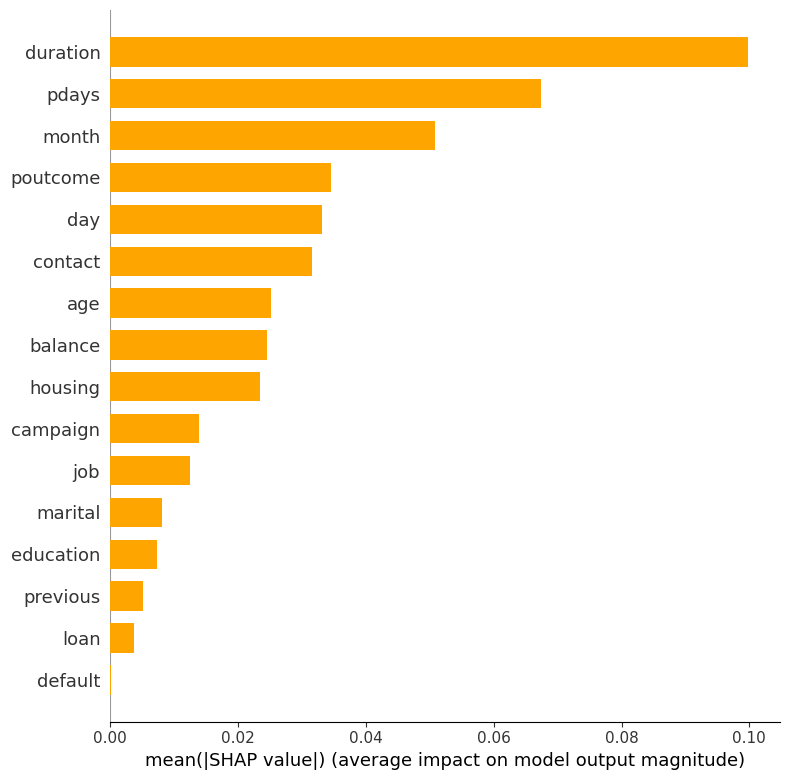

In [134]:
shap.summary_plot(tree_shap_values, X_train_scaled, plot_type="bar", color="orange")

### c. Shap Heatmap
 A SHAP heatmap provides a graphical representation of the SHAP values for each feature of a machine learning model for a set of instances. Each row in the heatmap represents an instance, while each column represents a feature. The color of each cell in the heatmap indicates the SHAP value for that feature and instance. Generally, red colors denote positive SHAP values, while blue colors represent negative SHAP values.

The SHAP heatmap enables the identification of the features that have the most significant impact on the model's predictions and how they contribute to individual predictions. This information can be beneficial in understanding the model's behavior, detecting biases or errors, and enhancing its performance.

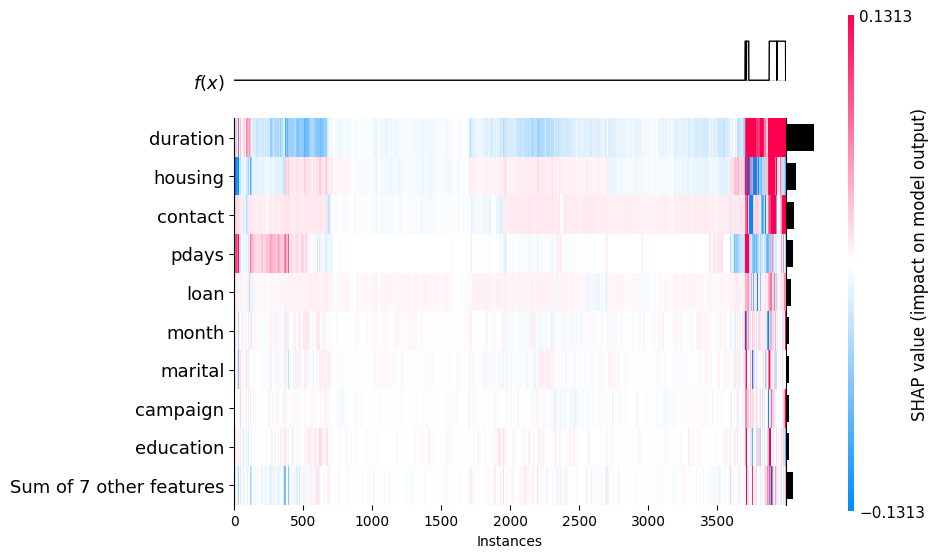

In [120]:
# SHAP HeatMap of a linear Based Model
shap.plots.heatmap(linear_shap_values)

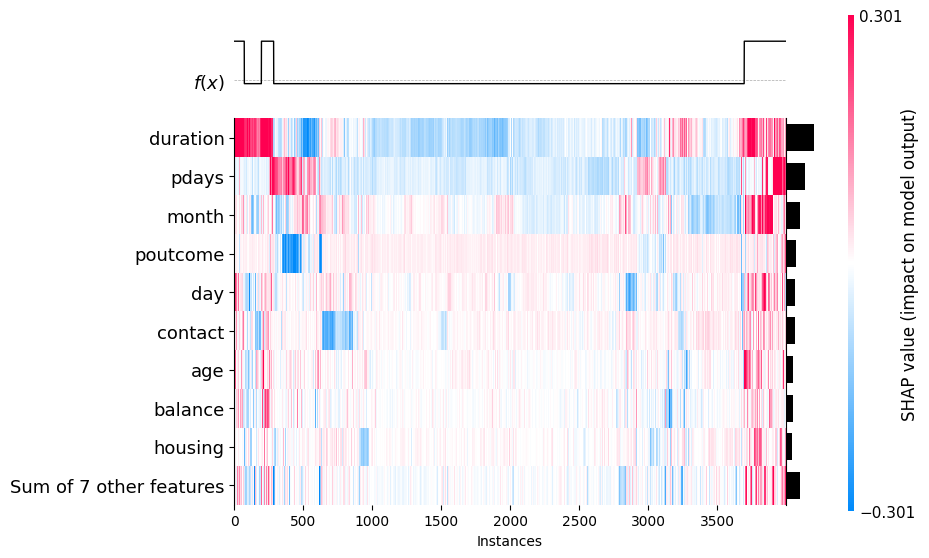

In [121]:
# SHAP HeatMap of a Tree Based Model
shap.plots.heatmap(tree_shap_values)

### d. Shap Beeswarm </br>

The function shap.plots.beeswarm() generates a swarm plot that displays the distribution of SHAP values for each feature in a dataset. The plot has two axes, where the x-axis corresponds to the SHAP value for each feature, and the y-axis represents the individual instances or samples in the dataset.

The x-axis displays the range of possible SHAP values, which can be positive or negative, indicating the correlation of each feature with the target variable. Positive SHAP values imply a positive correlation, while negative SHAP values indicate a negative correlation. Values closer to zero indicate that the feature has little to no effect on the target variable.

The colors in the plot indicate the direction of the correlation between each feature and the target variable. Blue colors represent negative correlations, implying that the feature has a negative impact on the target variable, while red colors represent positive correlations, indicating that the feature has a positive impact on the target variable.

The darker the color, the more significant the SHAP value is for that feature. In other words, the darker the color, the greater the impact that feature has on the target variable. The plot is useful for visualizing the distribution of SHAP values for each feature and identifying which features have the greatest impact on the target variable.

**Linear values**

For Linear values Duration is the most important in determining whether a person is opt for bank term deposit.

**Tree values**

For Tree values also **Duration** is the most important followed by housing as duration is also one of the important criteria for determining whether a person is opt for bank term deposit.

<Axes: xlabel='SHAP value (impact on model output)'>

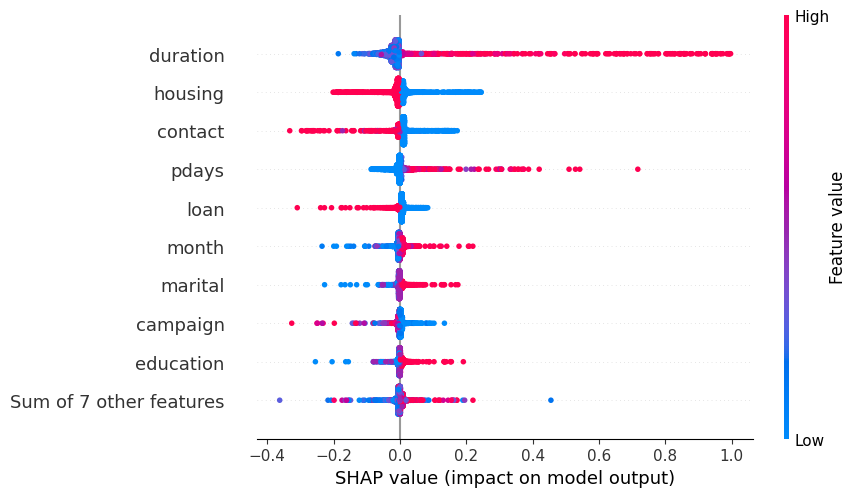

In [122]:
shap.plots.beeswarm(linear_shap_values, show=False)

<Axes: xlabel='SHAP value (impact on model output)'>

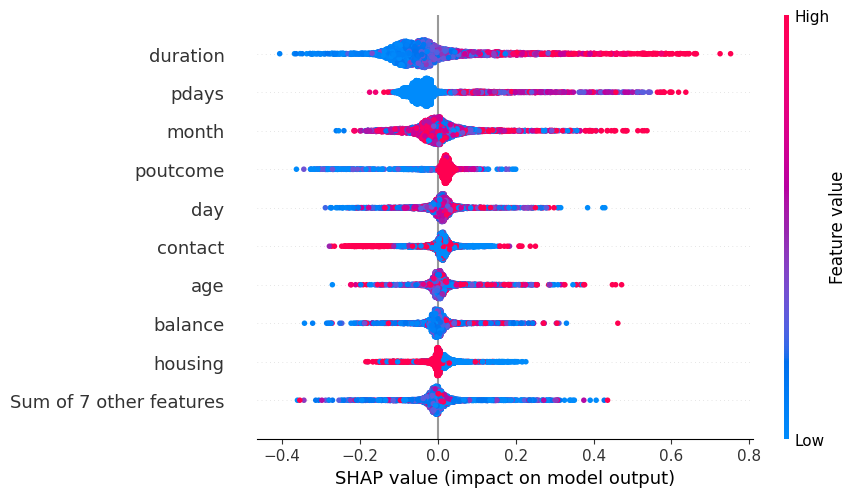

In [123]:
shap.plots.beeswarm(tree_shap_values, show=False)

### e. Waterfall
A SHAP waterfall plot is a visual tool that demonstrates the contribution of individual features to a machine learning model's prediction. The SHAP (SHapley Additive exPlanations) values, which quantify the importance of each feature for each data point, are used to explain the model's output.

The SHAP waterfall plot shows the cumulative impact of all features on the model's prediction for a particular data point. It divides the prediction into individual feature contributions, indicating how much each feature contributes to the prediction and whether it increases or decreases the prediction compared to the base value. The base value represents the average model prediction, and the final output of the plot is the sum of all feature contributions, which should be equal to the model's prediction for the given data point.

The plot begins at the top with the base value and progresses downward with each feature represented as a bar. If a feature has a positive SHAP value, it contributes positively to the prediction, and its bar is shown in blue. If a feature has a negative SHAP value, it contributes negatively to the prediction, and its bar is shown in red. The length of each bar depicts the feature's contribution magnitude to the prediction.

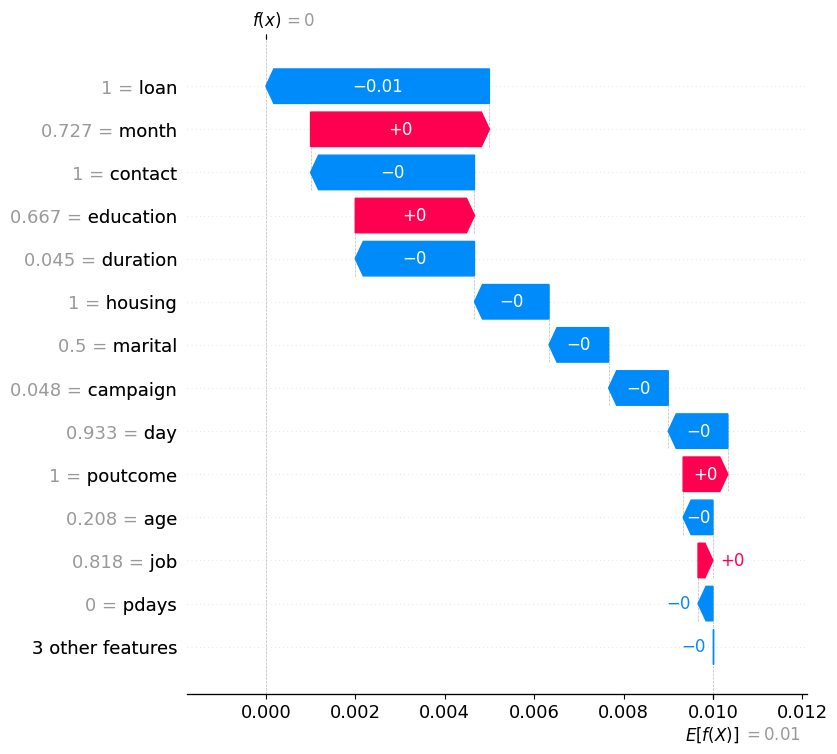

In [124]:
shap.plots.waterfall(linear_shap_values[sample_ind],max_display=14)

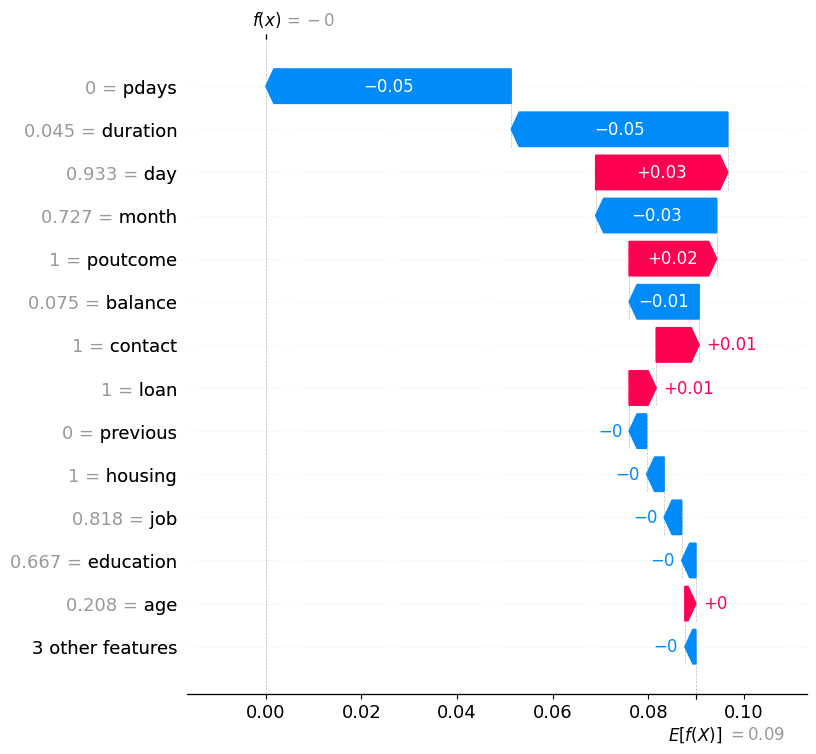

In [125]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

Each bar in the plot represents the contribution of a single feature to the overall prediction. The length of the bar indicates the magnitude of the feature's contribution.

The waterfall plot provides a visual representation of how each feature contributes to the difference between the base value and the final prediction for a specific instance

Each bar represents the change in prediction caused by the corresponding feature. Positive bars indicate features that increase the prediction, while negative bars indicate features that decrease the prediction.

# **Interpreting SHAP Analysis for H2o AutoML**

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
DRF_1_AutoML_2_20240318_24150,0.131775,0.0173646,0.0608712,0.0920004,0.0173646,14191,0.017109,DRF
XRT_1_AutoML_2_20240318_24150,0.140454,0.0197272,0.0670998,0.0978794,0.0197272,15463,0.017762,DRF
XGBoost_1_AutoML_2_20240318_24150,0.170472,0.0290606,0.0925443,0.12212,0.0290606,30222,0.004845,XGBoost
XGBoost_grid_1_AutoML_2_20240318_24150_model_1,0.174224,0.0303538,0.0855033,0.122904,0.0303538,29425,0.004091,XGBoost
XGBoost_2_AutoML_2_20240318_24150,0.1903,0.0362141,0.097516,0.134248,0.0362141,5466,0.004066,XGBoost
GBM_4_AutoML_2_20240318_24150,0.200809,0.0403241,0.102402,0.140224,0.0403241,5631,0.015031,GBM
XGBoost_grid_1_AutoML_2_20240318_24150_model_2,0.20082,0.0403286,0.100819,0.140895,0.0403286,6515,0.005135,XGBoost
GBM_3_AutoML_2_20240318_24150,0.22055,0.0486424,0.114185,0.153882,0.0486424,5268,0.012383,GBM
GBM_2_AutoML_2_20240318_24150,0.225205,0.0507174,0.117731,0.157349,0.0507174,8531,0.016784,GBM
GBM_5_AutoML_2_20240318_24150,0.226052,0.0510997,0.118174,0.158031,0.0510997,13526,0.016472,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

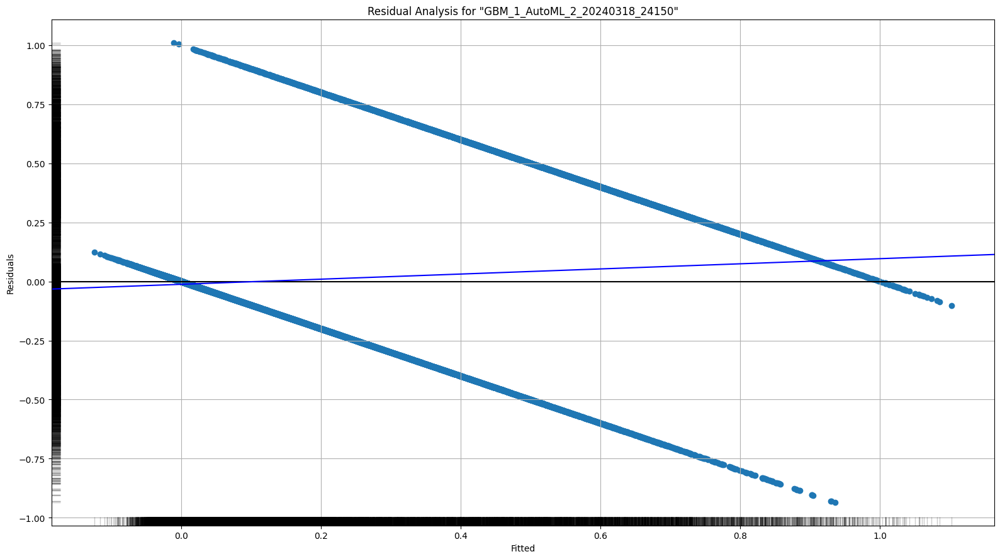

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

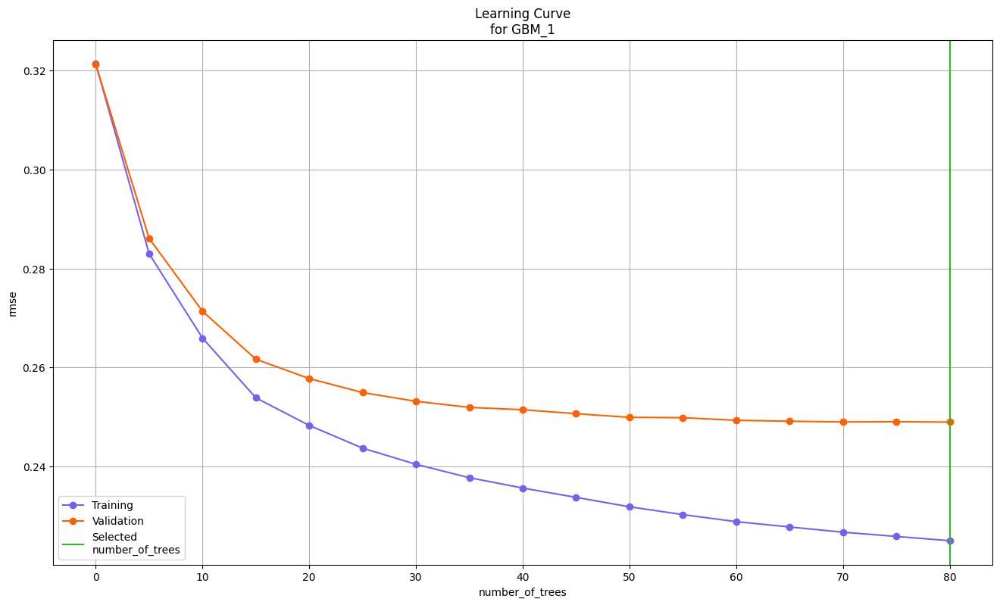

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

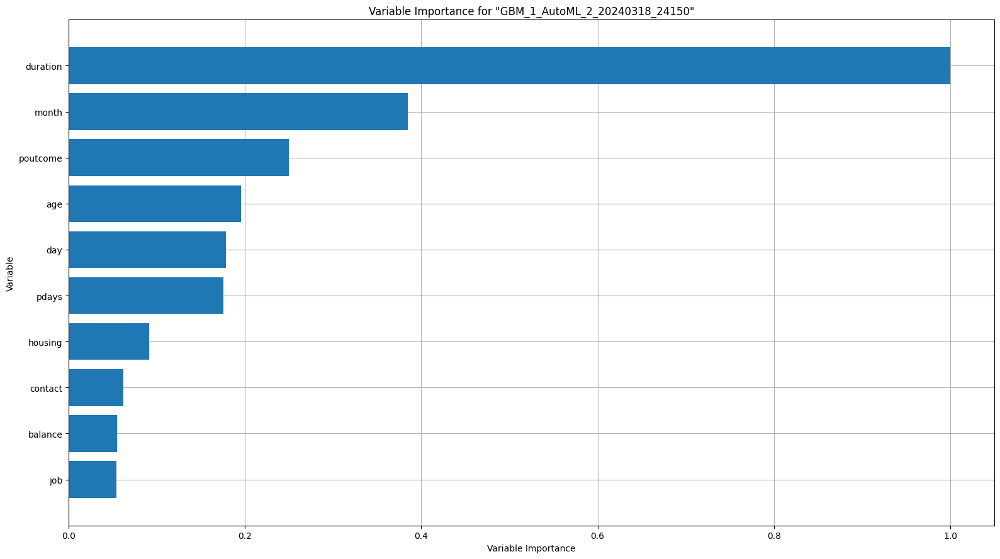

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

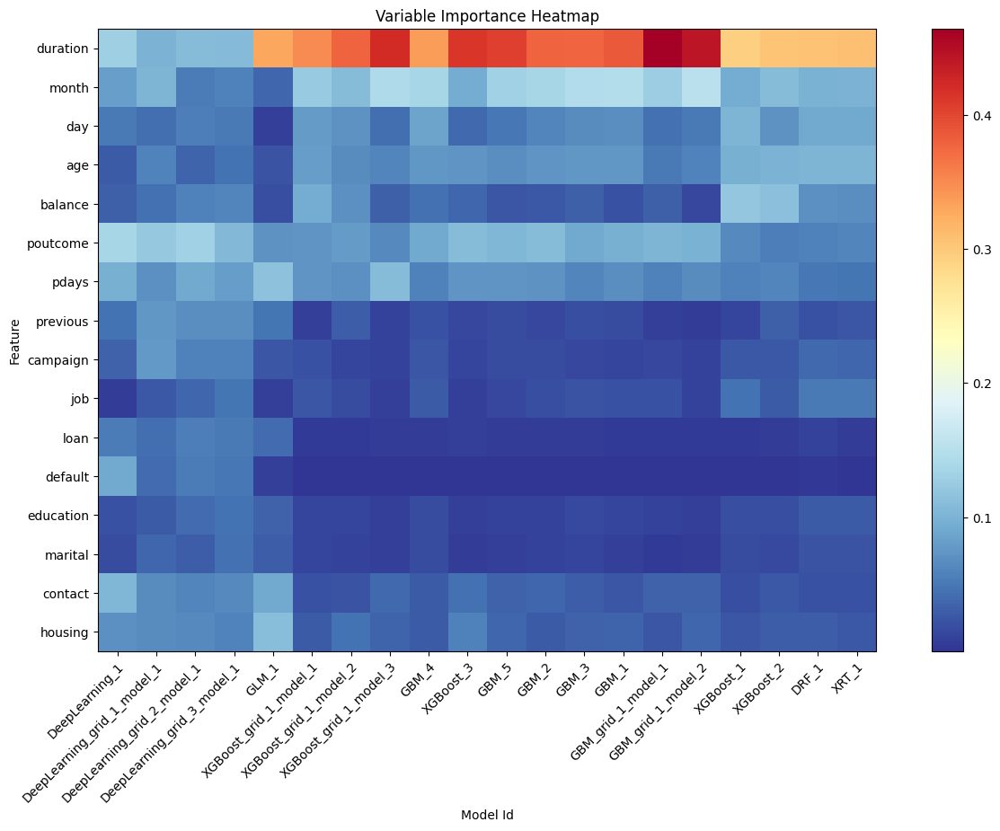

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

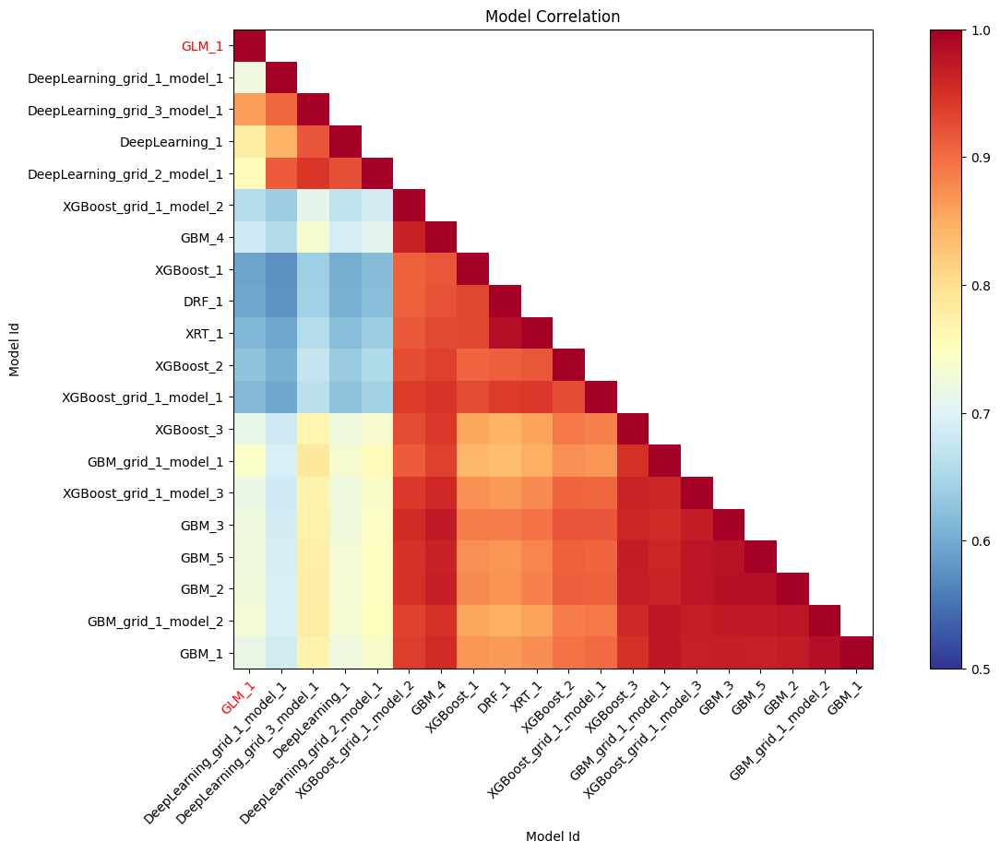

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

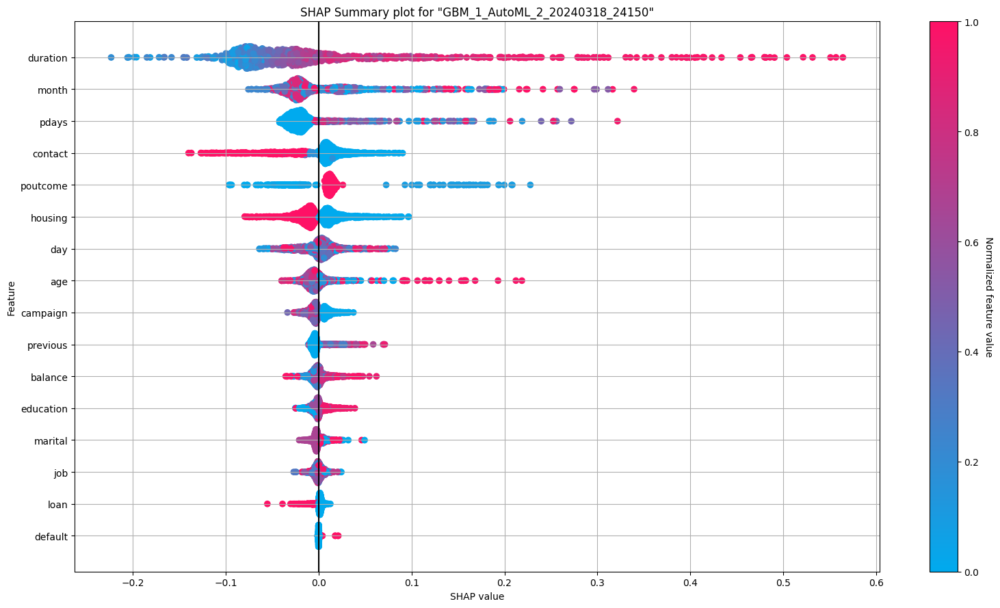

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

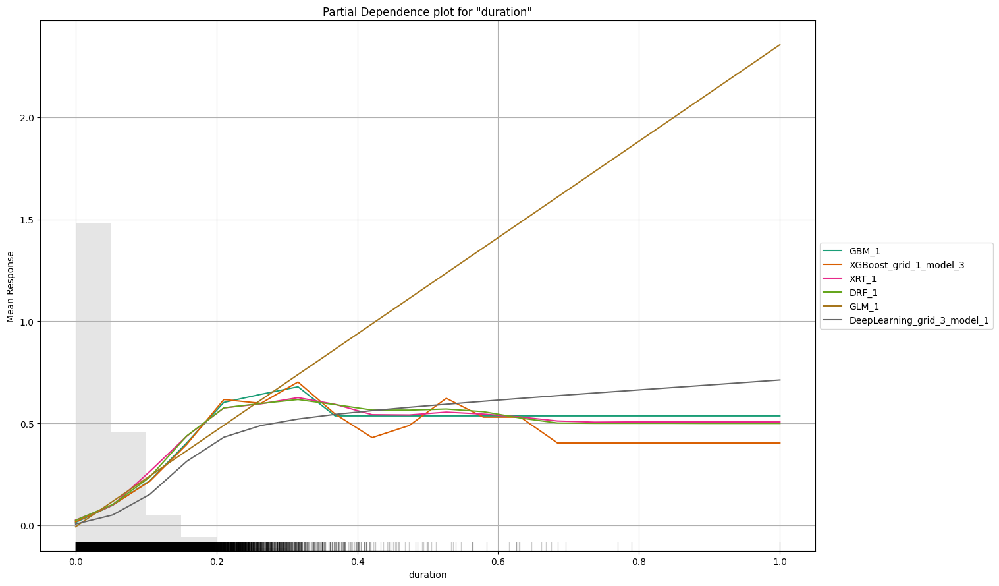

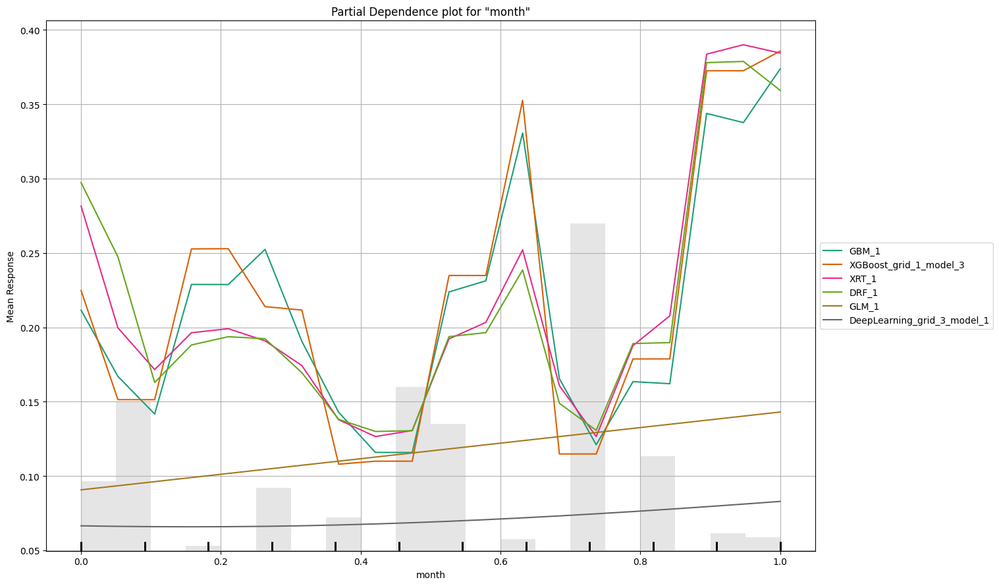

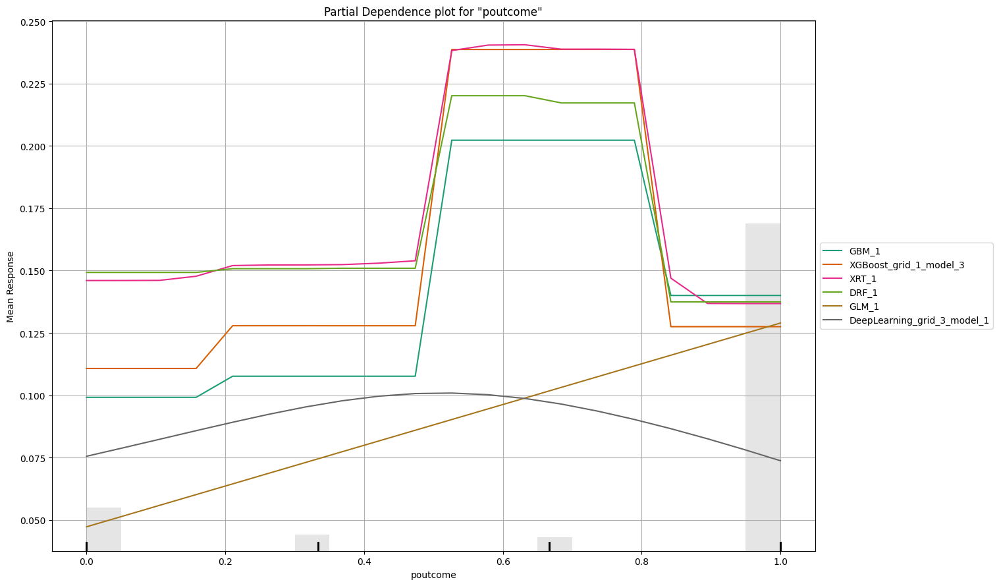

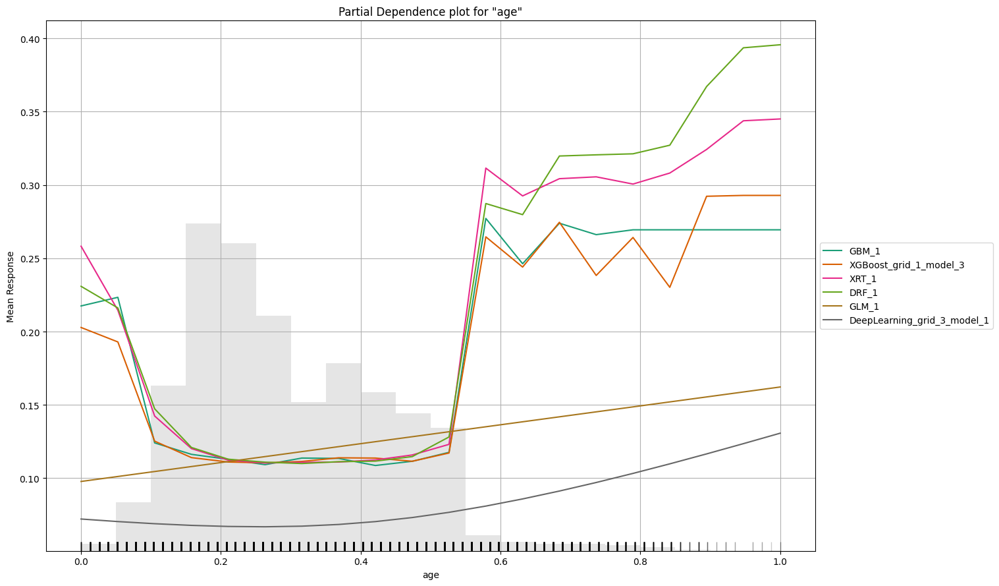

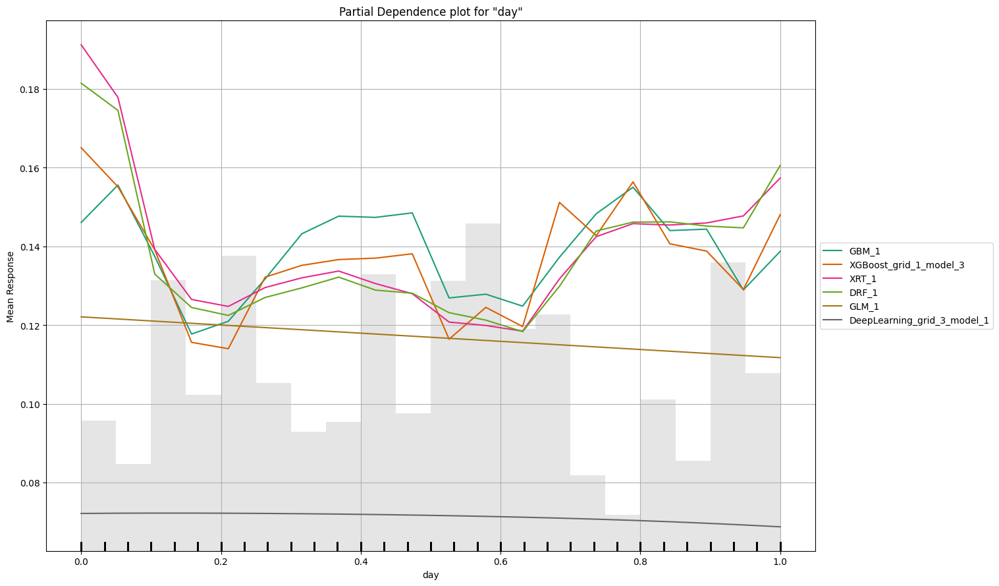

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

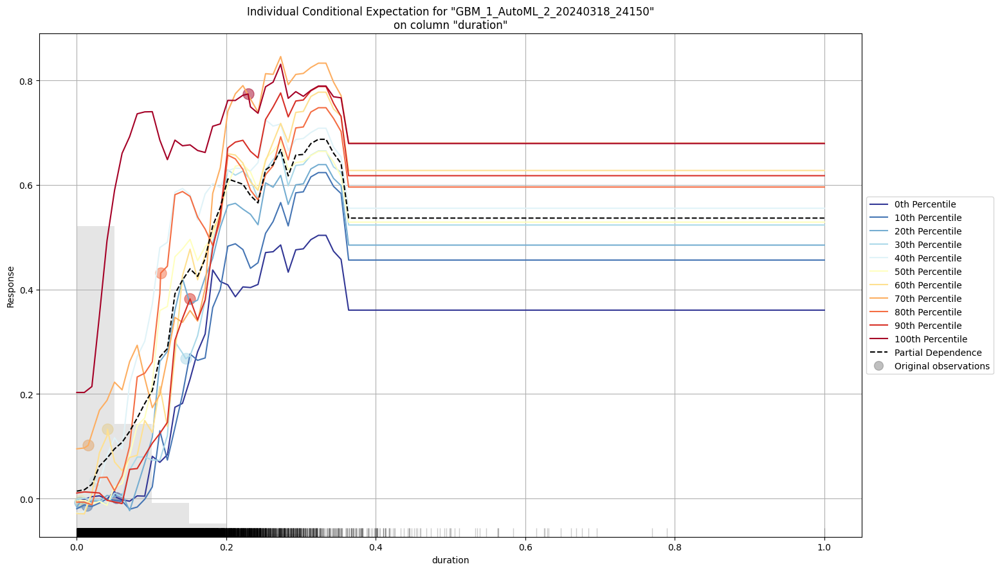

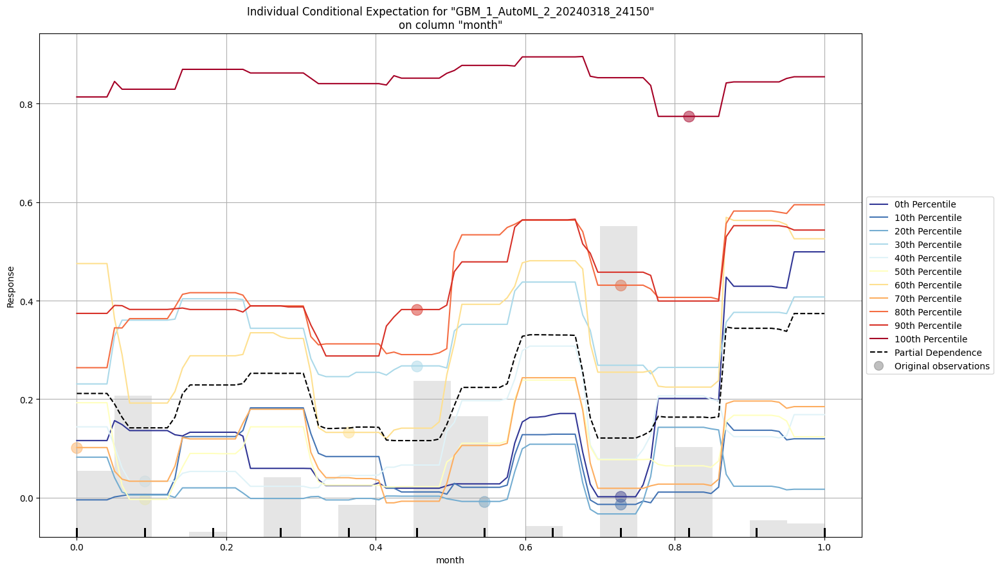

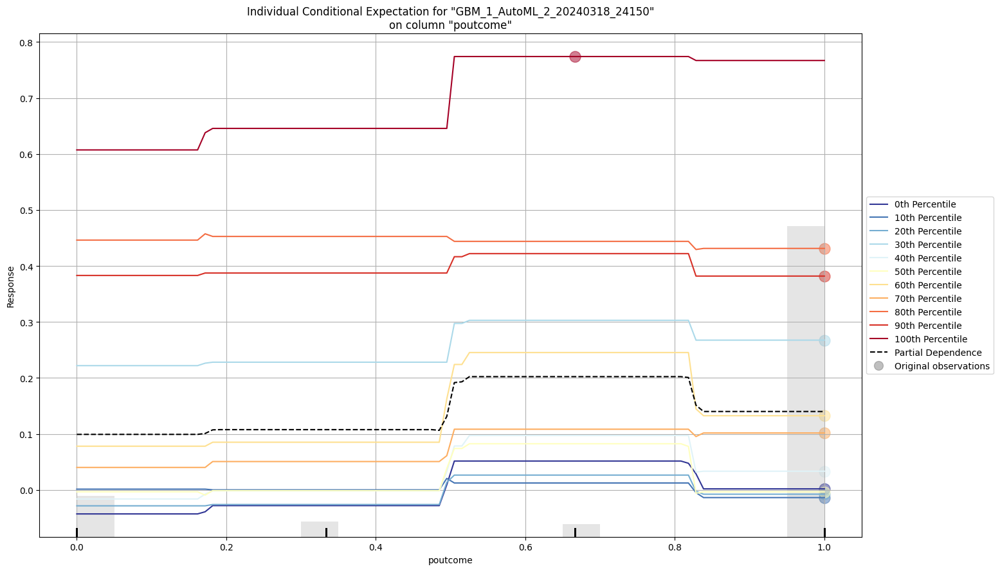

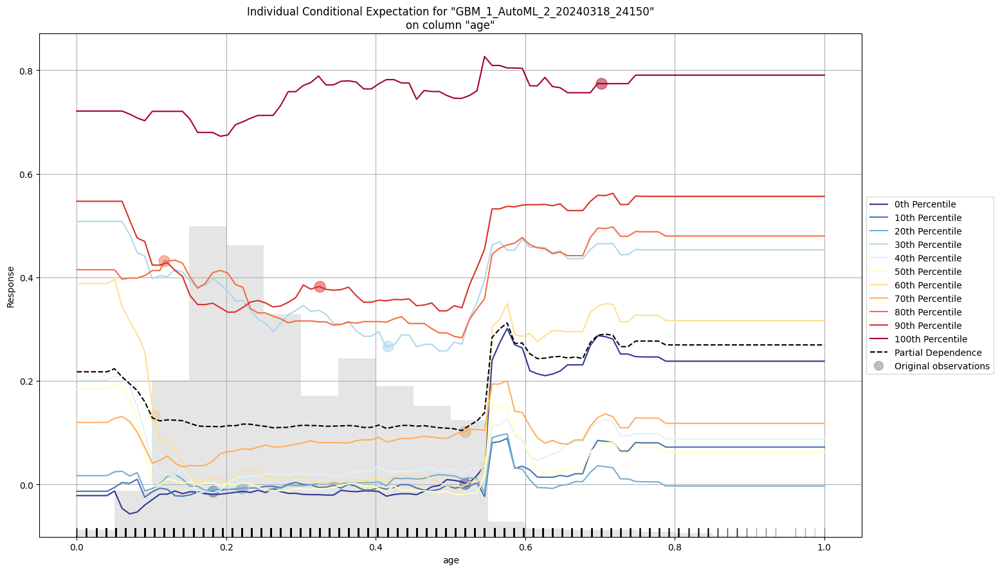

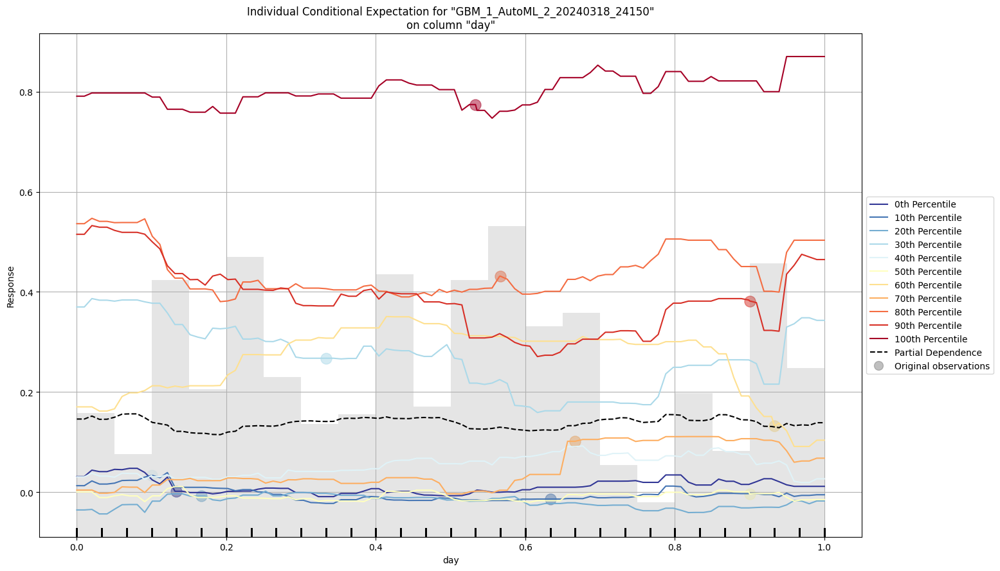



H2OExplanation([('leaderboard', H2OExplanation([('header', <h2o.explanation._explain.Header object at 0x7f92f09c1630>), ('description', <h2o.explanation._explain.Description object at 0x7f92f4688490>), ('data', H2OFrame({'_ex': <Expr(makeLeaderboard ['GBM_1_AutoML_2_20240318_24150', 'GBM_4_AutoML_2_20240318_24150', 'GBM_grid_1_AutoML_2_20240318_24150_model_2', 'GBM_2_AutoML_2_20240318_24150', 'GBM_5_AutoML_2_20240318_24150', 'XGBoost_grid_1_AutoML_2_20240318_24150_model_3', 'GBM_grid_1_AutoML_2_20240318_24150_model_1', 'GBM_3_AutoML_2_20240318_24150', 'XGBoost_grid_1_AutoML_2_20240318_24150_model_2', 'XRT_1_AutoML_2_20240318_24150', 'DRF_1_AutoML_2_20240318_24150', 'XGBoost_3_AutoML_2_20240318_24150', 'XGBoost_grid_1_AutoML_2_20240318_24150_model_1', 'XGBoost_2_AutoML_2_20240318_24150', 'XGBoost_1_AutoML_2_20240318_24150', 'GLM_1_AutoML_2_20240318_24150', 'DeepLearning_grid_3_AutoML_2_20240318_24150_model_1', 'DeepLearning_grid_2_AutoML_2_20240318_24150_model_1', 'DeepLearning_grid_1

In [126]:
from h2o import explanation
explanation = aml.explain(df_train_h2o)
print(explanation)


# **Method 2. PDP(Partial Dependence Plot) for Linear model and Tree-based Model**
A SHAP Partial Dependence Plot (PDP) is a visualization that helps understand the relationship between the target variable and one or more predictor variables in a machine learning model. The plot illustrates the expected impact of a specific predictor variable on the model output while keeping all other predictor variables constant.

In a SHAP PDP, each point on the plot denotes a combination of predictor variable values, while the y-axis represents the predicted output of the machine learning model. The plot's line represents the average predicted output for all combinations of predictor variable values. Meanwhile, the shaded area around the line represents the range of variation in the predicted output resulting from different values of other predictor variables

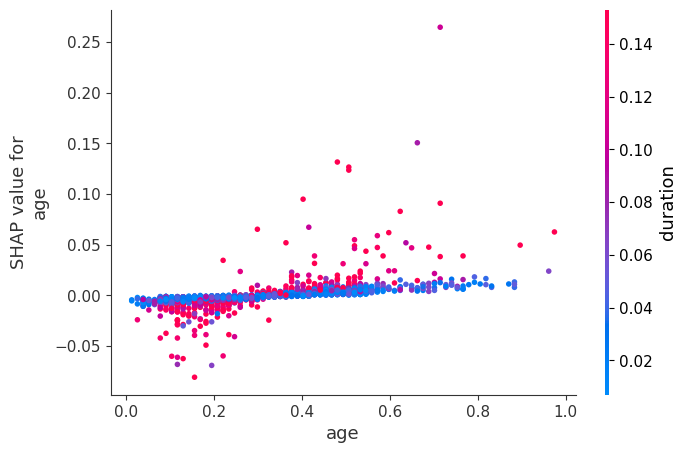

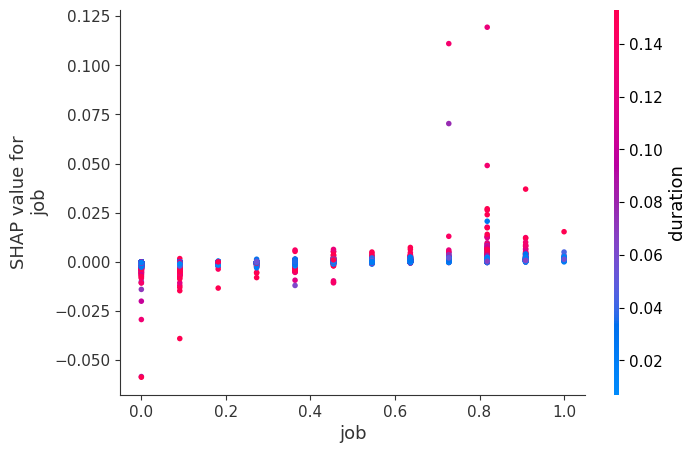

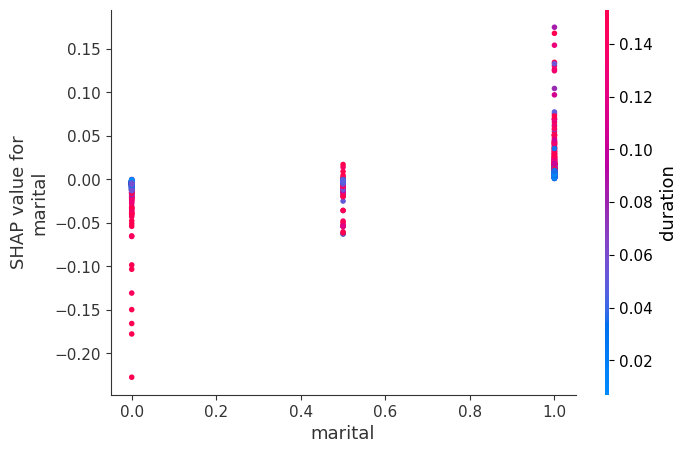

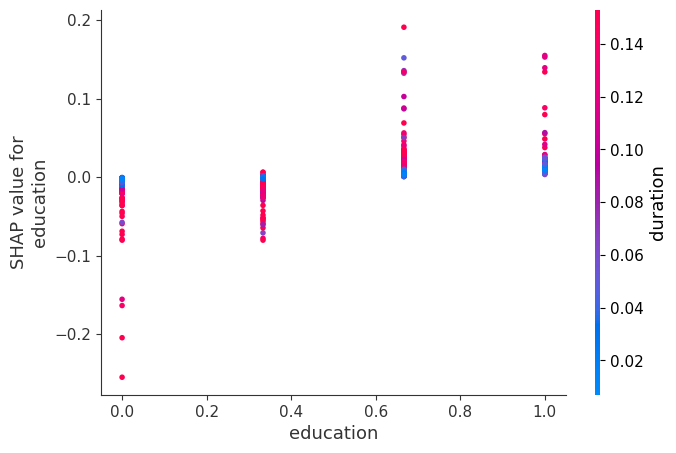

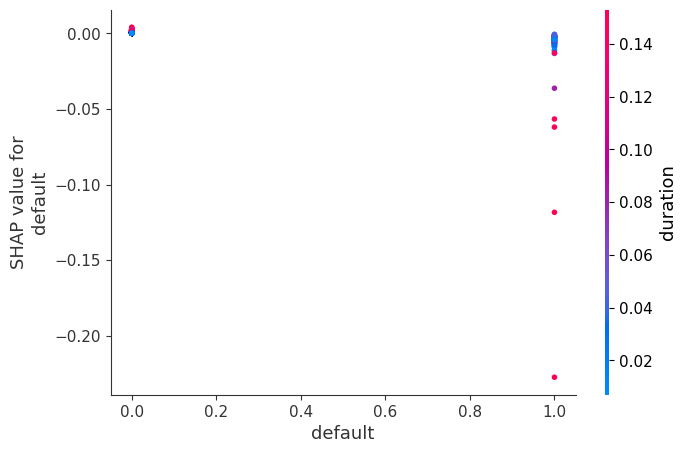

...

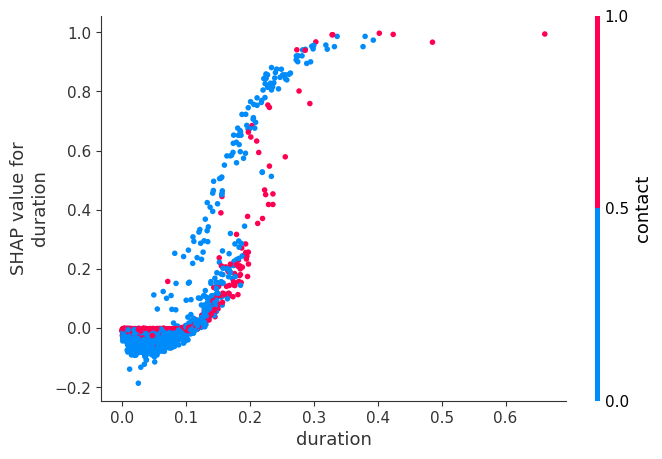

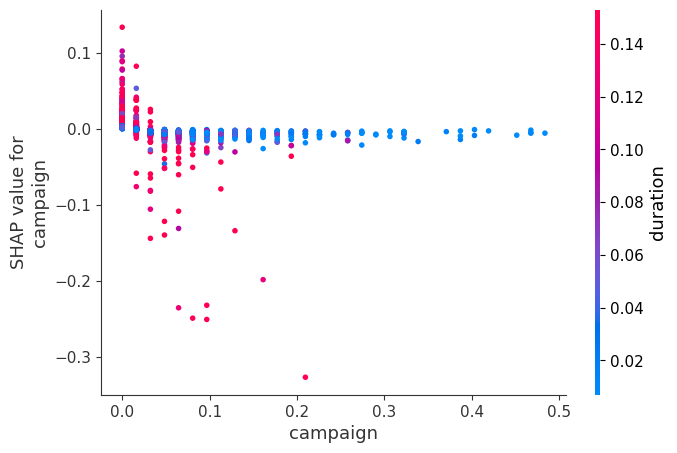

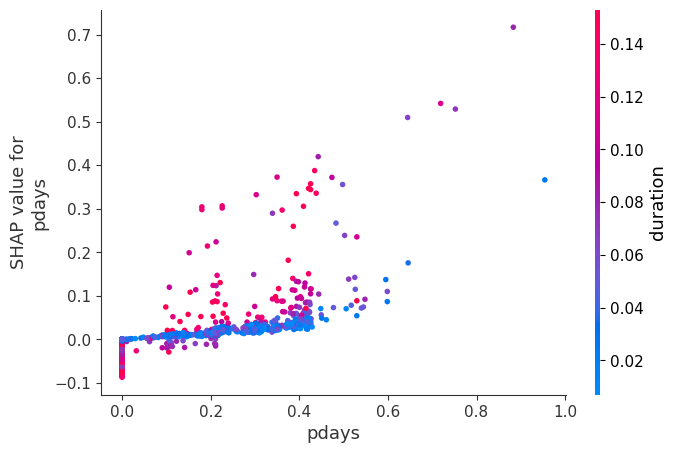

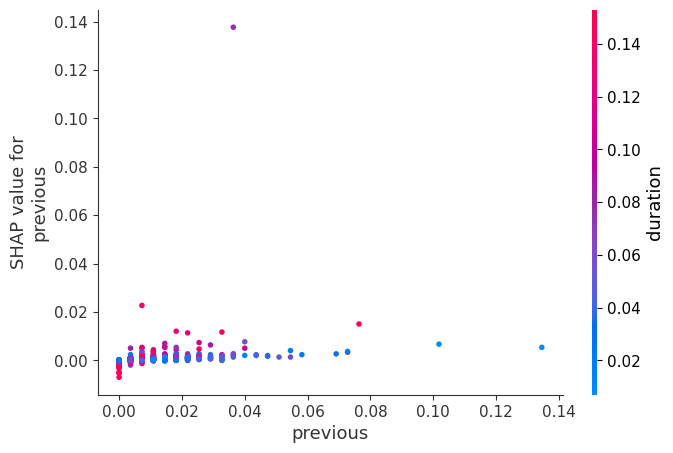

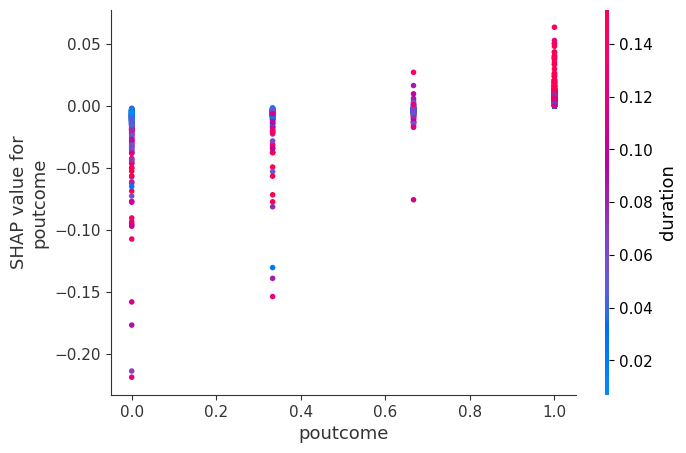

In [127]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train_4000)

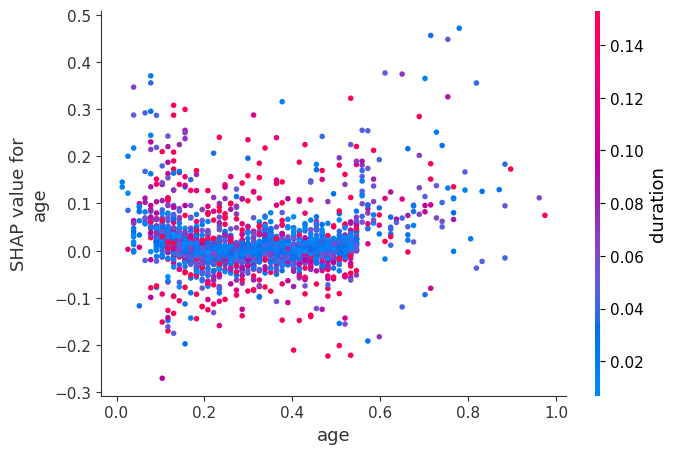

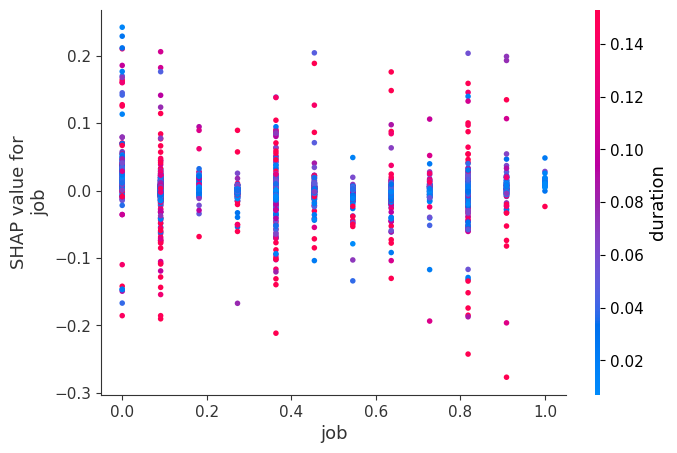

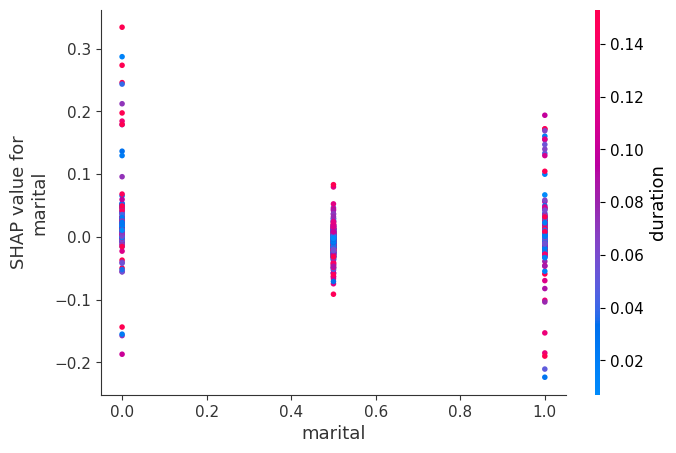

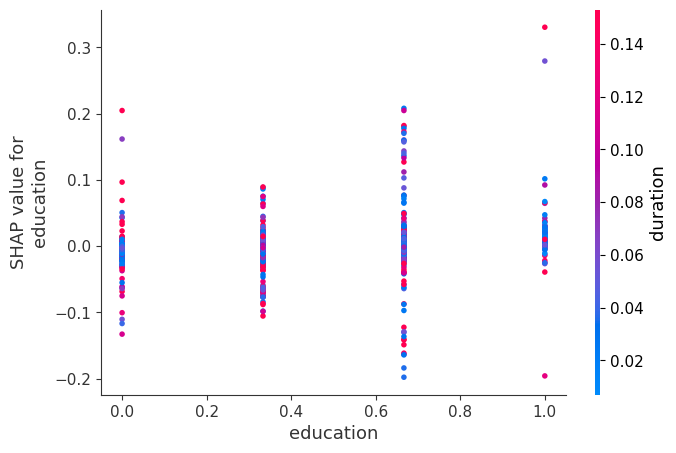

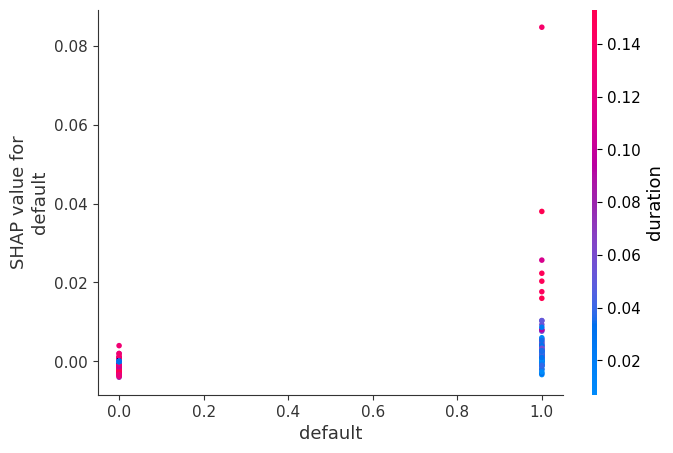

...

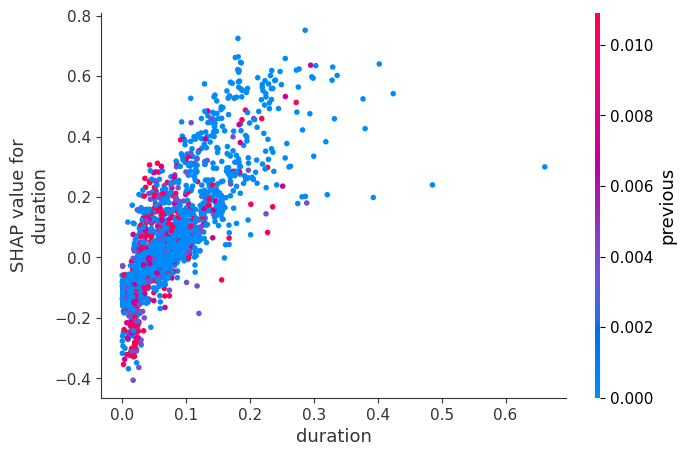

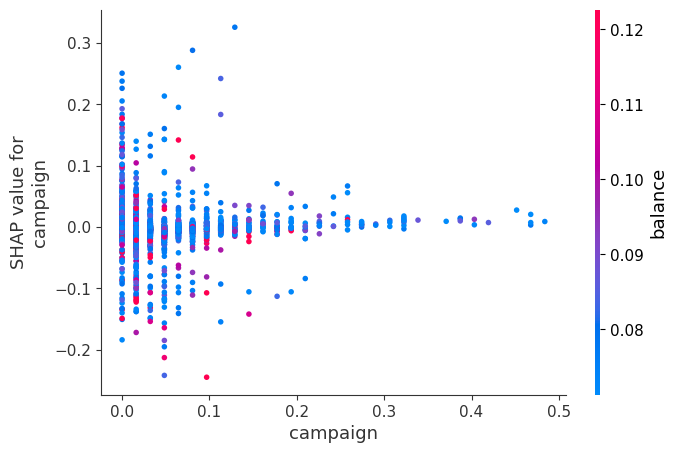

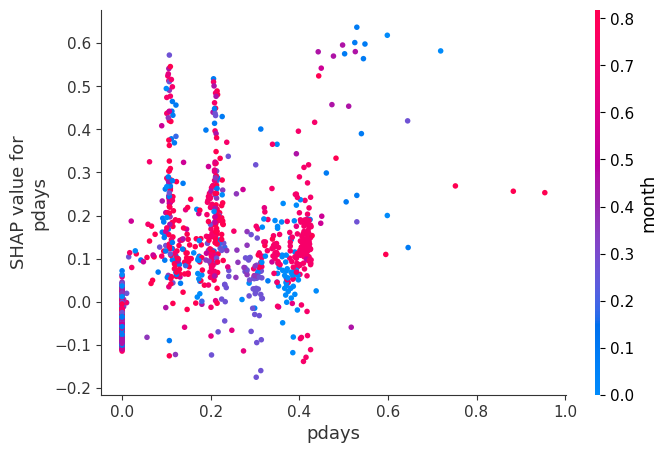

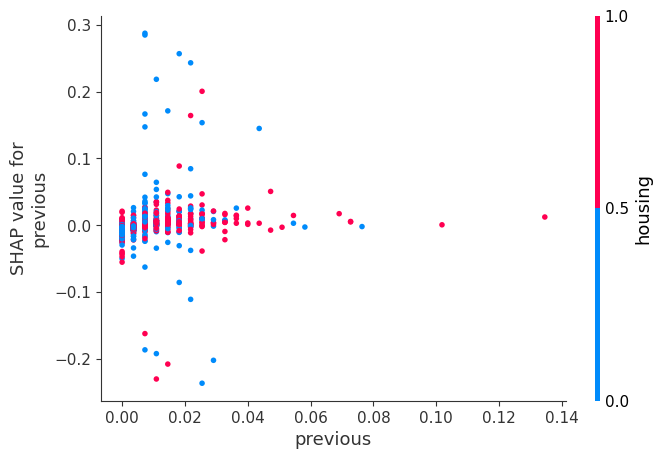

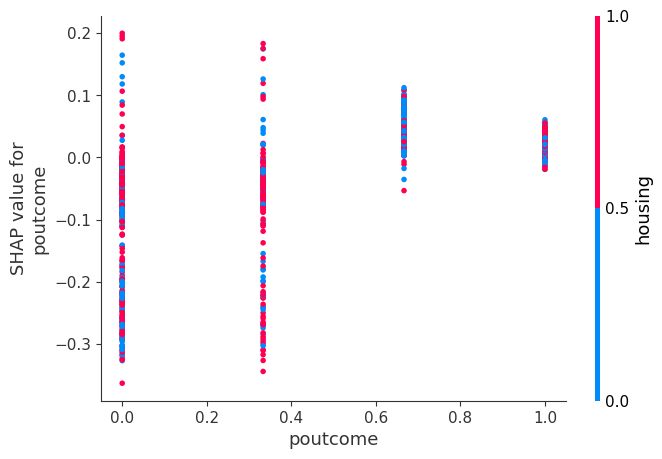

In [128]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, X_train_4000)

# Method 3. LIME (Local Interpretation Model-Agnostic Explanation) Analysis
The LimeTabularExplainer graph shows how each feature contributes to the model's prediction for the specific instance being explained. The orange color denotes the positive contribution of a feature, meaning that increasing its value makes the model more likely to predict the positive class (in this case, "Y").

On the other hand, the blue color represents the negative contribution of a feature, meaning that increasing its value makes the model more likely to predict the negative class (in this case, "N").

Features that have less impact on the prediction are closer to white in color. The graph provides a clear indication of the features that drive the model's prediction for a specific instance.

From the graph of Linear Regression and Tree Based Model, we can conclude that Property_Area_Semiurban has the most impact.

In [129]:
train = df_train_h2o.as_data_frame()
test = df_test_h2o.as_data_frame()

In [130]:
X_train = train.iloc[:, 0:-1]
y_train = train.iloc[:, -1]
X_test = test.iloc[:, 0:-1]
y_test = test.iloc[:, -1]

In [131]:
train_proba = classifier1.predict_proba(X_train)[:, 1]
test_proba = classifier1.predict_proba(X_test)[:, 1]

lime_linear_explainer = LimeTabularExplainer(
    X_train.values, feature_names=X_train.columns, class_names=["N", "Y"], mode="classification"
)

idx = 18
np_X_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", classifier1.predict(np_X_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_X_test[idx], classifier1.predict_proba, num_features=np_X_test.shape[1]
)

lime_linear_explanation


Prediction :  [0]
Actual :      0


In [132]:
lime_linear_explanation.show_in_notebook()

This image appears to be an interpretation of a linear model or a decision tree visualization, showing the probabilities and feature importance for predicting a binary outcome, likely representing two classes labeled as 'N' and 'Y'.

On the left side, the probabilities of predicting each class are shown, with 0.97 for 'N' and 0.03 for 'Y'. This suggests that the model is more likely to predict the 'N' class based on the given feature values.

The central part of the image is a tree-like structure, where each node represents a condition or split on a particular feature. The values at the nodes indicate the probability or proportion of data points that satisfy the corresponding condition.

The conditions are based on various features, such as 'duration', 'pdays' (number of days after the previous campaign), 'housing', 'contact', 'loan', 'default', 'campaign', 'education', 'marital', 'age', 'previous', 'month', 'day', 'job', 'balance', and 'poutcome' (outcome of the previous campaign).

For example, the condition 'duration > 0.06' has a probability of 0.23, indicating that 23% of the data points have a duration value greater than 0.06. Similarly, 'pdays <= 0.00' has a probability of 0.09, meaning 9% of the data points have a pdays value less than or equal to 0.

On the right side, the values of the features for a specific instance or example are shown. This instance has a duration of 0.08, pdays of 0.00, and values of 1.00 for housing and contact, 0.00 for loan and default, and so on.

This visualization allows you to understand the decision rules and feature importances learned by the linear model or decision tree for making predictions. It can help interpret how different feature values influence the predicted class probabilities.

In [133]:
def predict_fn(x):
    return decision_tree_classifier.predict_proba(x)
feature_names = list(X_train.columns)
lime_linear_explainer = LimeTabularExplainer(X_train.to_numpy(), feature_names=feature_names, class_names=["N", "Y"], mode='classification')
idx = 18
lime_linear_explanation = lime_linear_explainer.explain_instance(X_test.to_numpy()[idx], predict_fn, num_features=len(feature_names))
lime_linear_explanation.show_in_notebook()


# **Conclusion**


> In conclusion, the selection of interpretability methods involves navigating a spectrum of accuracy and interpretability trade-offs. LIME and SHAP stand out as prominent approaches for interpreting black-box models. LIME achieves this by constructing a local linear model to approximate the black-box model's behavior around a specific data point, while SHAP utilizes game theory principles to compute the marginal contribution of each feature to the model's predictions.While Partial Dependence Plots (PDP) isolate individual variables to observe their impact on the output, SHAP provides a comprehensive breakdown of each variable's contribution to the output.

> Selecting the most suitable interpretability method hinges on understanding the specific requirements of the analysis and striking a balance between accuracy and interpretability. While SHAP offers greater reliability and theoretical robustness, it may necessitate more significant computational resources. Conversely, LIME is lightweight and suitable for certain scenarios, yet may not match the accuracy of SHAP. PDP excels in elucidating the influence of single variables but might not be ideal for intricate models with interdependent features. Thus, choosing the appropriate method entails careful consideration of these factors to ensure effective model interpretation.



# **References**

* Scikit learn offcial documentation (https://scikit-learn.org/stable/modules/classes.html)
* Scikit learn Metrics (https://scikit-learn.org/stable/modules/model_evaluation.html)
* Pandas official documentation(https://pandas.pydata.org/docs/reference/index.html)
* Sea born (https://seaborn.pydata.org/api.html)
* Matplotlib (https://matplotlib.org/stable/api/index.html#)
* Shap official documentation: https://shap.readthedocs.io/en/latest/index.html
* LIME Analysis: https://towardsdatascience.com/decrypting-your-machine-learning-model-using-lime-5adc035109b5
* Interpreting SHAP Feature Importance Plot for Linear and Tree-based model: https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137

Copyright 2024 Manashree Patel

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.